# Augmented time stretch HuBERT-SER model

Time Stretch. Modifies the speaking rate by stretching or
compressing the temporal axis of an audio signal, while pre-
serving the original spectral characteristics. This reflects re-
alistic fluctuations in speech tempo caused by factors such as
stress, urgency, or fatigue, all of which can influence emo-
tional expression. The stretch parameter (called rate) governs
how much the audio is sped up or slowed down. This allow-
ing the model to learn from natural variations in speech rate.

#### **Flow**:

This program will follow the steps:
1. General Preparation  
2. Data Processing
3. Augmentation Method - Time Stretch
5. Loading the Model and Optimizer
6. Training
7. Testing
8. Testing all test sets

## 1. General Preparation

In [ ]:
# Install required packages
%%capture
!pip install datasets transformers evaluate accelerate torch
!pip install torch torchaudio

Import some common libraries.

In [ ]:
import time
from tqdm import tqdm
import torch
import os
import soundfile as sf
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import Wav2Vec2FeatureExtractor, HubertForSequenceClassification
from datasets import Dataset
from torch.optim import AdamW
from torch.utils.data import DataLoader
import librosa
from sklearn.metrics import classification_report, confusion_matrix
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio


Use GPU Facilities.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Set Seed for Reproducibility

In [ ]:
SEED = 42

def set_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(SEED)

Mount google drive

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
BASE_DIR = "/content/drive/MyDrive/YourProject"

Mounted at /content/drive


## 2. Data Processing

### 2.1 Load RAVDESS dataset

Download dataset file from website https://zenodo.org/record/1188976

In [ ]:
%%capture
![ -f Audio_Speech_Actors_01-24.zip ] && echo "File existed" || wget "https://zenodo.org/record/1188976/files/Audio_Speech_Actors_01-24.zip?download=1" -O Audio_Speech_Actors_01-24.zip

Unzip dataset file.

In [ ]:
%%capture
![ -f "./Audio_Speech_Actors_01-24/Actor_01/03-01-01-01-01-01-01.wav" ] && echo "File existed" || unzip Audio_Speech_Actors_01-24.zip -d "./Audio_Speech_Actors_01-24/"

### 2.2 Create RAVDESS data frame

In [ ]:
# Process dataset
RAV = "./Audio_Speech_Actors_01-24/"
dir_list = os.listdir(RAV)
dir_list.sort()

emotion = []
gender = []
path = []
for i in dir_list:
   fname = os.listdir(RAV + i)
   for f in fname:
       part = f.split('.')[0].split('-')
       emotion.append(int(part[2]))
       temp = int(part[6])
       gender.append("female" if temp%2 == 0 else "male")
       path.append(RAV + i + '/' + f)

# Create DataFrame
RAV_df = pd.DataFrame(emotion)
RAV_df = RAV_df.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'})
RAV_df = pd.concat([pd.DataFrame(gender), RAV_df, pd.DataFrame(emotion)],axis=1)
RAV_df.columns = ['gender','emotion','labels']
RAV_df['source'] = 'RAVDESS'
RAV_df = pd.concat([RAV_df,pd.DataFrame(path, columns = ['path'])],axis=1)
RAV_df.emotion.value_counts()

,count
emotion,
disgust,192
surprise,192
calm,192
fear,192
happy,192
angry,192
sad,192
neutral,96


In [ ]:
RAV_df

,gender,emotion,labels,source,path
0,male,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-07-...
1,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-08-...
2,male,calm,2,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-02-...
3,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-08-...
4,male,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-06-...
...,...,...,...,...,...
1435,female,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-08-...
1436,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-04-...
1437,female,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-06-...
1438,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-04-...


In our project we examine 7 emotions:

In [ ]:
RAV_df = RAV_df[
   (RAV_df["emotion"]=="neutral") |
   (RAV_df["emotion"]=="happy") |
   (RAV_df["emotion"]=="sad") |
   (RAV_df["emotion"]=="angry") |
   (RAV_df["emotion"]=="fear") |
   (RAV_df["emotion"]=="disgust") |
   (RAV_df["emotion"]=="surprise")
]
print(f"Shape of data frame: {RAV_df.shape}")
RAV_df.emotion.value_counts()

Shape of data frame: (1248, 5)


,count
emotion,
disgust,192
surprise,192
fear,192
happy,192
angry,192
sad,192
neutral,96


### 2.3 Spliting the data
Split into training (80%) and test (20%) data.

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming RAV_df has a column named 'labels' for stratification
train_df, test_df = train_test_split(
    RAV_df,
    test_size=0.2,
    random_state=42,
    stratify=RAV_df['emotion']
)

Let's have a look at the training data.

In [ ]:
train_df

,gender,emotion,labels,source,path
322,female,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_06/03-01-03-...
1006,male,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_17/03-01-03-...
940,female,angry,5,RAVDESS,./Audio_Speech_Actors_01-24/Actor_16/03-01-05-...
286,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_05/03-01-08-...
128,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_03/03-01-08-...
...,...,...,...,...,...
379,male,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_07/03-01-08-...
1079,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_18/03-01-04-...
1185,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_20/03-01-04-...
1065,female,surprise,8,RAVDESS,./Audio_Speech_Actors_01-24/Actor_18/03-01-08-...


In [ ]:
train_df["emotion"].value_counts()

,count
emotion,
angry,154
surprise,154
disgust,154
happy,153
fear,153
sad,153
neutral,77


In [ ]:
# Display the first data.
import IPython.display as ipd
id = 0
print(train_df.iloc[id])
ipd.Audio(data=train_df.iloc[id]["path"], autoplay=True, rate=16000)

gender                                                female
emotion                                                happy
labels                                                     3
source                                               RAVDESS
path       ./Audio_Speech_Actors_01-24/Actor_06/03-01-03-...
Name: 322, dtype: object


### Save and load

In [ ]:
# Save the DataFrames with the paths
train_df.to_pickle('train_df.pkl')
test_df.to_pickle('test_df.pkl')
print("DataFrames saved as pickle files.")
# Save training and testing datasets
train_df.to_csv("train_df_clean.csv", index=False)
test_df.to_csv("test_df_clean.csv", index=False)
print("Datasets saved successfully!")


DataFrames saved as pickle files.
Datasets saved successfully!


## 3. Augmentation Method - Time stretch

In [ ]:
# Augmentation Methods
def time_stretch(audio, rate=1.0):
    return librosa.effects.time_stretch(y=audio, rate=rate)

def add_noise(audio, noise_level=0.01):
    noise = np.random.normal(0.005, noise_level, audio.shape)
    return audio + noise

def copy_paste(audio1, audio2, ratio=0.5):
    len1 = int(len(audio1) * ratio)
    len2 = len(audio2) - len1
    return np.concatenate((audio1[:len1], audio2[:len2]))

def spec_augment(audio, sample_rate, time_mask_param=30, freq_mask_param=10):
    np.random.seed(SEED)  # Ensure reproducibility
    time_mask = np.random.uniform(0, time_mask_param)
    freq_mask = np.random.uniform(0, freq_mask_param)
    augmented_audio = audio.copy()
    # Apply time mask
    if len(audio) > time_mask:
        start = np.random.randint(0, len(audio) - int(time_mask))
        augmented_audio[start: start + int(time_mask)] = 0
    # Apply frequency mask (simulated as scaling random parts of audio)
    if freq_mask < len(audio):
        start = np.random.randint(0, len(audio) - int(freq_mask))
        augmented_audio[start: start + int(freq_mask)] *= 0.5
    return augmented_audio

# Define Fixed Parameters for Each Augmentation
param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}

### Visualize augmetation methods

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio

def visualize_augmentation(audio_path, augmentation_method, params, sample_rate=16000):
    """
    Creates a comprehensive visualization comparing original and augmented audio.
    Uses 16kHz sample rate to match HuBERT's requirements.

    Parameters:
    -----------
    audio_path : str
        Path to the audio file to be analyzed
    augmentation_method : str
        Name of the augmentation method to apply
    params : dict
        Parameters specific to the chosen augmentation method
    sample_rate : int
        Sampling rate for audio processing (default: 16000 Hz for HuBERT)
    """
    # Load the audio file with HuBERT's required sample rate
    audio_original, sr = librosa.load(audio_path, sr=sample_rate)

    # Apply augmentation
    if augmentation_method == "time_stretch":
        rate = params.get('rate', 1.0)
        audio_augmented = time_stretch(audio_original, rate=rate)
    elif augmentation_method == "add_noise":
        noise_level = params.get('noise_level', 0.005)
        audio_augmented = add_noise(audio_original, noise_level)
    elif augmentation_method == "spec_augment":
        time_mask_param = params.get('time_mask_param', 30)
        freq_mask_param = params.get('freq_mask_param', 10)
        audio_augmented = spec_augment(audio_original, sr,
                                     time_mask_param=time_mask_param,
                                     freq_mask_param=freq_mask_param)
    elif augmentation_method == "copy_paste":
        ratio = params.get('ratio', 0.5)
        audio_augmented = copy_paste(audio_original, audio_original, ratio)
    else:
        raise ValueError(f"Unknown augmentation method: {augmentation_method}")

    # Create visualization with time axis in seconds
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Plot original waveform
    times = np.arange(len(audio_original)) / sr
    librosa.display.waveshow(audio_original, sr=sr, ax=axes[0,0])
    axes[0,0].set_title('Original Waveform')
    axes[0,0].set_xlabel('Time (s)')
    axes[0,0].set_ylabel('Amplitude')

    # Plot original spectrogram
    D = librosa.amplitude_to_db(np.abs(librosa.stft(audio_original)), ref=np.max)
    img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[0,1])
    axes[0,1].set_title('Original Spectrogram')
    plt.colorbar(img, ax=axes[0,1], format='%+2.0f dB')

    # Plot augmented waveform
    librosa.display.waveshow(audio_augmented, sr=sr, ax=axes[1,0])
    axes[1,0].set_title(f'Augmented Waveform ({augmentation_method})')
    axes[1,0].set_xlabel('Time (s)')
    axes[1,0].set_ylabel('Amplitude')

    # Plot augmented spectrogram
    D_aug = librosa.amplitude_to_db(np.abs(librosa.stft(audio_augmented)), ref=np.max)
    img_aug = librosa.display.specshow(D_aug, sr=sr, x_axis='time', y_axis='hz', ax=axes[1,1])
    axes[1,1].set_title(f'Augmented Spectrogram ({augmentation_method})')
    plt.colorbar(img_aug, ax=axes[1,1], format='%+2.0f dB')

    plt.tight_layout()

    # Add information about the sample rate
    plt.figtext(0.02, 0.02, f'Sample Rate: {sr} Hz', fontsize=8)

    return fig, audio_original, audio_augmented, sr

def demo_augmentation(df, emotion, augmentation_method, params):
    """
    Demonstrates the effect of audio augmentation on a sample from the dataset.
    Uses HuBERT's required 16kHz sample rate.
    """
    # Select a random sample for the given emotion
    sample = df[df['emotion'] == emotion].sample(1, random_state=42).iloc[0]

    # Create the visualizations and get the audio data
    fig, audio_orig, audio_aug, sr = visualize_augmentation(
        sample['path'],
        augmentation_method,
        params
    )

    # Display the figure
    plt.show()

    # Create audio players for both original and augmented audio
    print("\nOriginal Audio:")
    display(Audio(audio_orig, rate=sr))
    print(f"\nAugmented Audio ({augmentation_method}):")
    display(Audio(audio_aug, rate=sr))

    # Print detailed information
    print(f"\nAudio Information:")
    print(f"Sample Rate: {sr} Hz")
    print(f"Original Duration: {len(audio_orig)/sr:.2f} seconds")
    print(f"Augmented Duration: {len(audio_aug)/sr:.2f} seconds")
    print(f"\nAugmentation Parameters:")
    for param_name, param_value in params.items():
        print(f"{param_name}: {param_value}")

    return fig, audio_orig, audio_aug

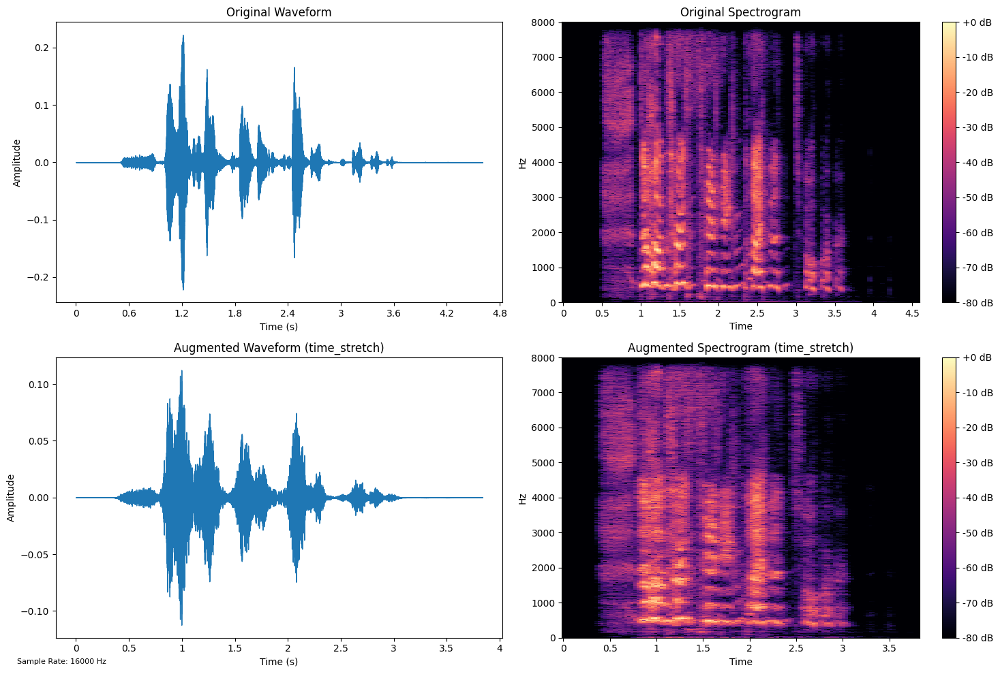


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 4.60 seconds
Augmented Duration: 3.84 seconds

Augmentation Parameters:
rate: 1.2


(<Figure size 1500x1000 with 6 Axes>,
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         4.0203574e-09, -5.5339108e-08,  0.0000000e+00], dtype=float32),
 array([-1.5789619e-08,  2.1509813e-08,  3.2974636e-08, ...,
        -2.4973997e-06,  3.6704732e-06, -7.1192753e-06], dtype=float32))

In [ ]:
demo_augmentation(
    train_df,
    emotion='sad',
    augmentation_method='time_stretch',
    params={'rate': 1.2}
)

**Happy and time strech**

In [ ]:
def load_and_play_audio(file_path):
    """
    Loads an audio file and provides tools to examine it.
    Returns the audio signal, sample rate, and creates a visualization.
    Also enables audio playback in the notebook.
    """
    # Load the audio file
    audio, sr = librosa.load(file_path, sr=16000, mono=True)

    # Create visualizations
    plt.figure(figsize=(15, 5))

    # Plot waveform
    plt.subplot(2, 1, 1)
    plt.title('Waveform')
    librosa.display.waveshow(audio, sr=sr)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')

    # Plot spectrogram
    plt.subplot(2, 1, 2)
    plt.title('Spectrogram')
    D = librosa.amplitude_to_db(np.abs(librosa.stft(audio)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

    # Return audio player widget
    return Audio(audio, rate=sr), audio, sr
# Function to sample one file per emotion with explanation
def sample_emotion_file(df, emotion, seed=42):
    """
    Samples one file for a specific emotion from the DataFrame.
    Parameters:
        df: DataFrame containing our dataset
        emotion: String specifying which emotion to sample
        seed: Random seed for reproducibility
    Returns:
        Dictionary containing file information
    """
    # Filter for the specific emotion
    emotion_files = df[df['emotion'] == emotion]

    # Sample one file using the random seed
    sampled_file = emotion_files.sample(n=1, random_state=seed).iloc[0]

    return {
        'path': sampled_file['path'],
        'gender': sampled_file['gender'],
        'emotion': sampled_file['emotion']
    }

Sampled happy file details:
Path: ./Audio_Speech_Actors_01-24/Actor_20/03-01-03-02-02-01-20.wav
Gender: female
{'path': './Audio_Speech_Actors_01-24/Actor_20/03-01-03-02-02-01-20.wav', 'gender': 'female', 'emotion': 'happy'}


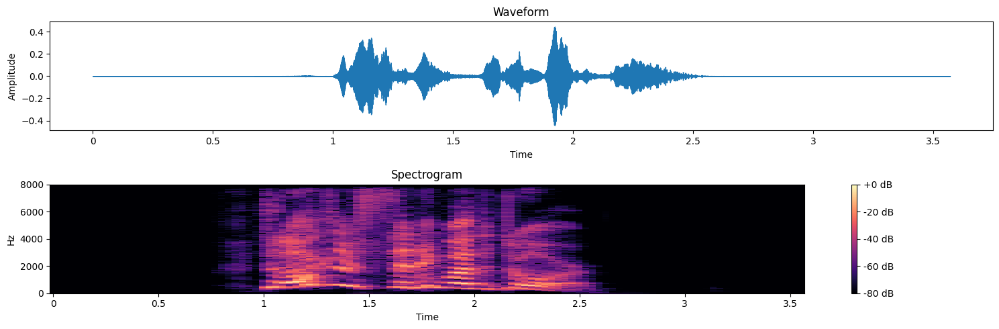

gender                                                female
emotion                                                happy
labels                                                     3
source                                               RAVDESS
path       ./Audio_Speech_Actors_01-24/Actor_06/03-01-03-...
Name: 322, dtype: object


In [ ]:
# Let's sample and examine one file from each emotion
emotions = ["happy", "sad", "angry", "neutral", "fear", "disgust", "surprise"]

# Sample happy emotion as requested
happy_sample = sample_emotion_file(train_df, "happy")
print(f"Sampled {happy_sample['emotion']} file details:")
print(f"Path: {happy_sample['path']}")
print(f"Gender: {happy_sample['gender']}")
print(happy_sample)
# Now you can load and examine this specific file
player, audio, sr = load_and_play_audio(happy_sample['path'])
# Display the first data.
import IPython.display as ipd
id = 0
print(train_df.iloc[id])
ipd.Audio(data=train_df.iloc[id]["path"], autoplay=True, rate=16000)

 ### Gread search of augmentation methods
 Systematic way to test all augmentation methods across different emotions and parameter ranges.
```s
 param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}
```

In [ ]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import time

def test_augmentation_parameters(train_df,
                                 emotions=["happy", "sad", "angry", "neutral", "fear", "disgust", "surprise"],
                                 save_path=None):
    """
    Systematically tests all augmentation methods with their parameter ranges across different emotions.

    Parameters:
    -----------
    train_df : pandas.DataFrame
        The training dataset containing audio samples
    emotions : list
        List of emotions to test (default includes all six emotions)
    save_path : str, optional
        Path to save the visualizations (if None, only displays them)
    """
    # Create a results dictionary to store observations
    results = {
        'emotion': [],
        'augmentation': [],
        'parameters': [],
        'duration': []
    }

    # Testing time_stretch
    print("\n=== Testing Time Stretch Augmentation ===")
    for emotion, rate in itertools.product(emotions, param_values['time_stretch']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Rate: {rate}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='time_stretch',
            params={'rate': rate}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('time_stretch')
        results['parameters'].append(f'rate={rate}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/timestretch_{emotion}_{rate}.png")
        plt.close()

    # Testing add_noise
    print("\n=== Testing Noise Addition Augmentation ===")
    for emotion, noise_level in itertools.product(emotions, param_values['add_noise']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Noise Level: {noise_level}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='add_noise',
            params={'noise_level': noise_level}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('add_noise')
        results['parameters'].append(f'noise_level={noise_level}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/noise_{emotion}_{noise_level}.png")
        plt.close()

    # Testing spec_augment
    print("\n=== Testing SpecAugment ===")
    for emotion, (time_mask, freq_mask) in itertools.product(
        emotions,
        zip(param_values['spec_augment']['time_mask_param'],
            param_values['spec_augment']['freq_mask_param'])
    ):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Time Mask: {time_mask}, Freq Mask: {freq_mask}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='spec_augment',
            params={'time_mask_param': time_mask, 'freq_mask_param': freq_mask}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('spec_augment')
        results['parameters'].append(f'time_mask={time_mask}, freq_mask={freq_mask}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/specaugment_{emotion}_{time_mask}_{freq_mask}.png")
        plt.close()

    # Create a summary DataFrame
    results_df = pd.DataFrame(results)

    # Display summary statistics
    print("\n=== Augmentation Testing Summary ===")
    summary = results_df.groupby(['augmentation', 'emotion'])['duration'].agg(['mean', 'std', 'count'])
    display(HTML(summary.to_html()))

    return results_df

Test all augmentations with all parameters and emotions.
Here we demonstrate on'happy' emotion.


=== Testing Time Stretch Augmentation ===

Emotion: happy, Rate: 0.8


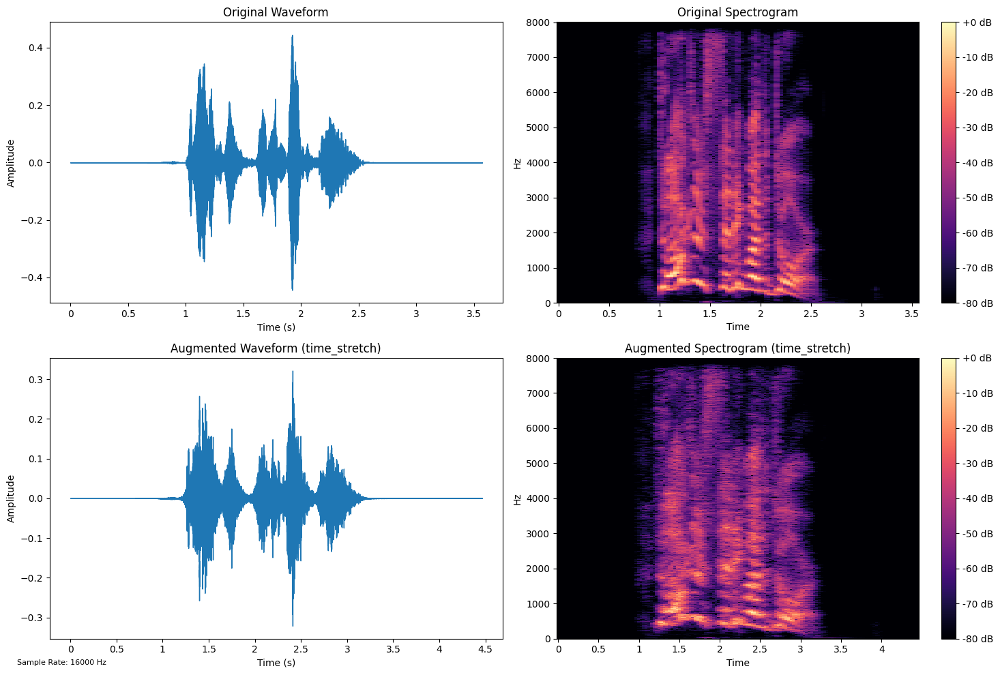


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 4.46 seconds

Augmentation Parameters:
rate: 0.8

Emotion: happy, Rate: 0.9


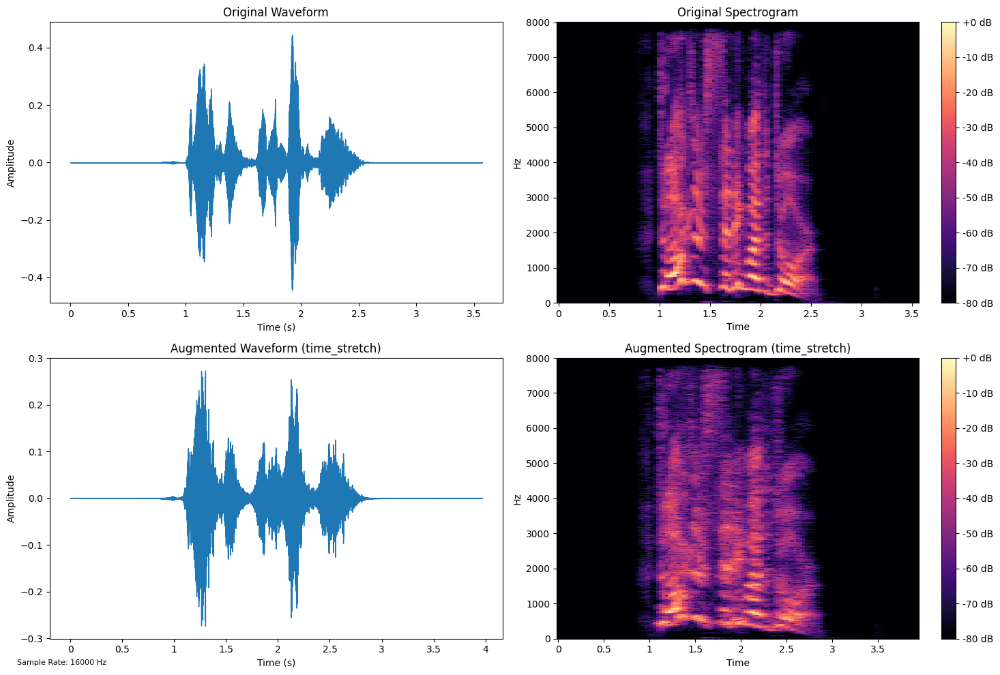


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.97 seconds

Augmentation Parameters:
rate: 0.9

Emotion: happy, Rate: 1.0


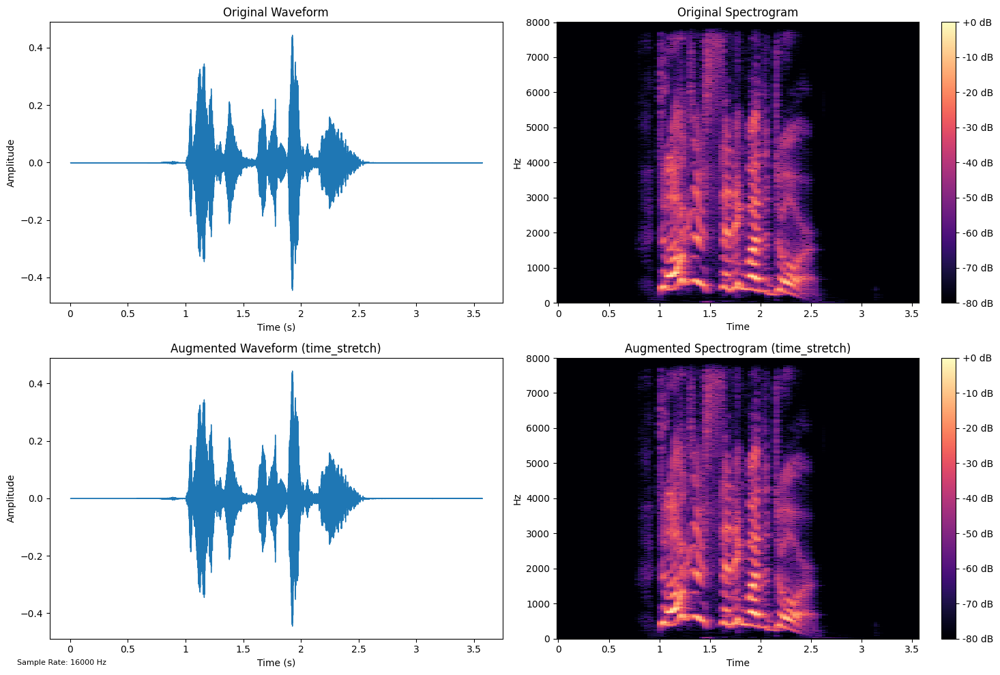


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
rate: 1.0

Emotion: happy, Rate: 1.1


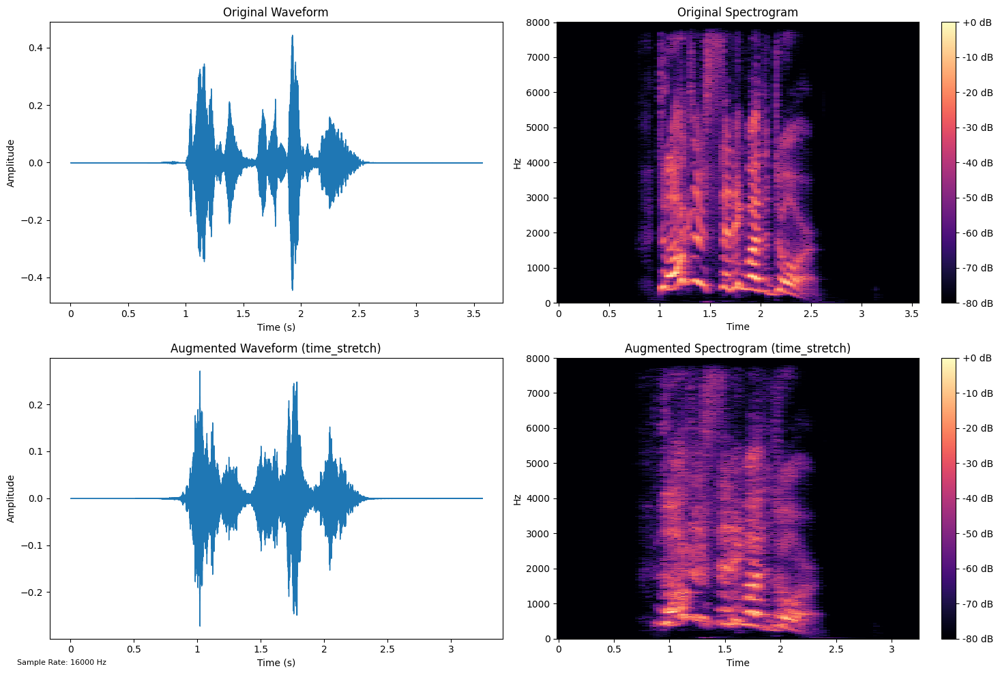


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.25 seconds

Augmentation Parameters:
rate: 1.1

Emotion: happy, Rate: 1.2


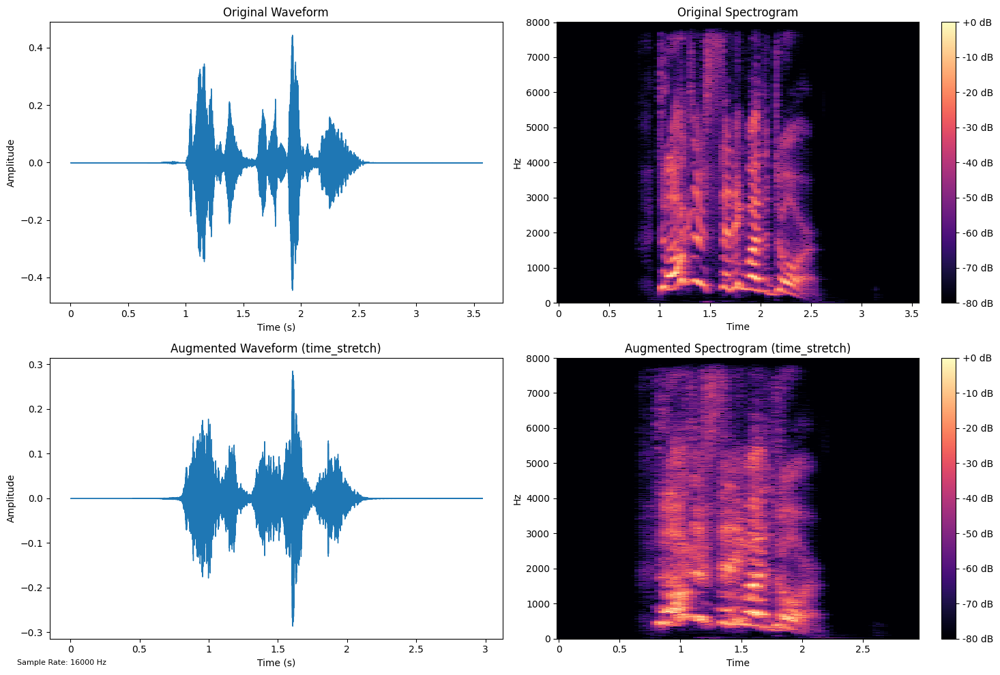


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 2.98 seconds

Augmentation Parameters:
rate: 1.2

=== Testing Noise Addition Augmentation ===

Emotion: happy, Noise Level: 0.001


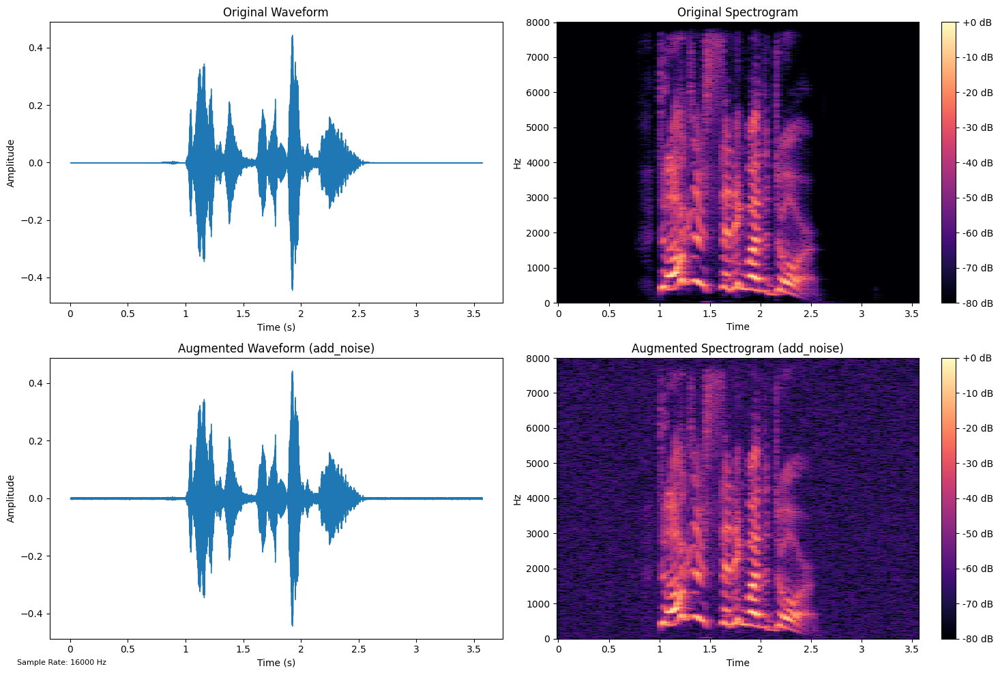


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.001

Emotion: happy, Noise Level: 0.005


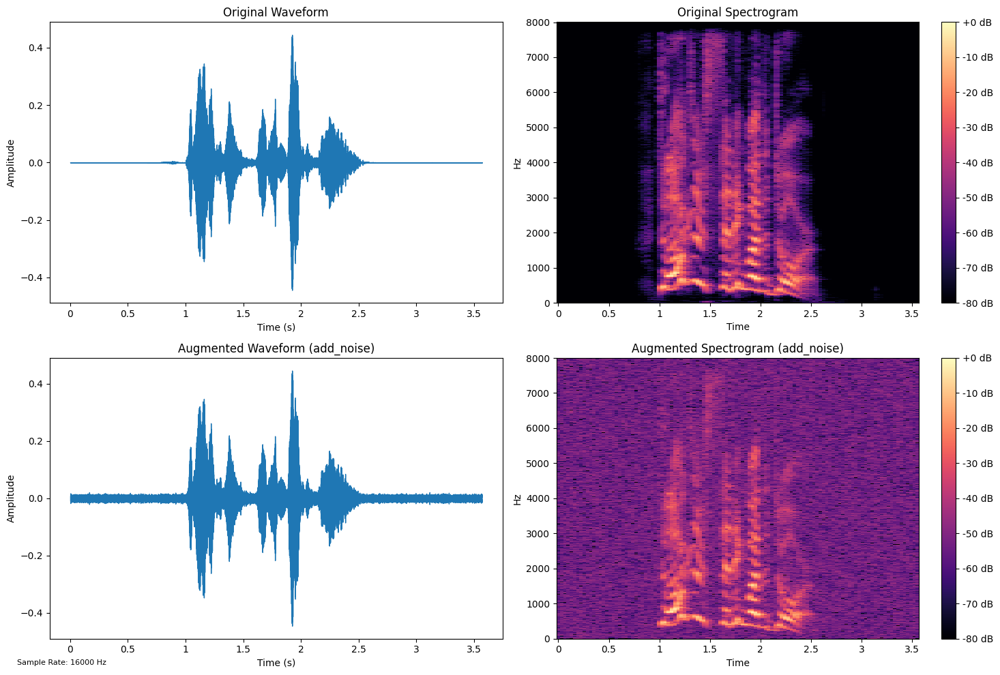


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.005

Emotion: happy, Noise Level: 0.01


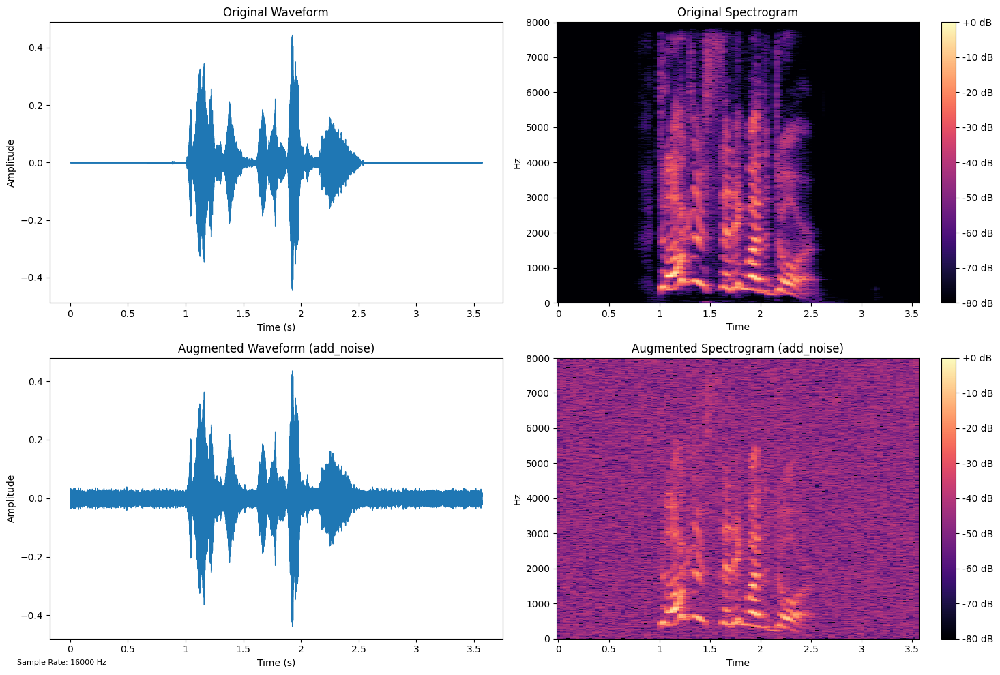


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
noise_level: 0.01

=== Testing SpecAugment ===

Emotion: happy, Time Mask: 10, Freq Mask: 10


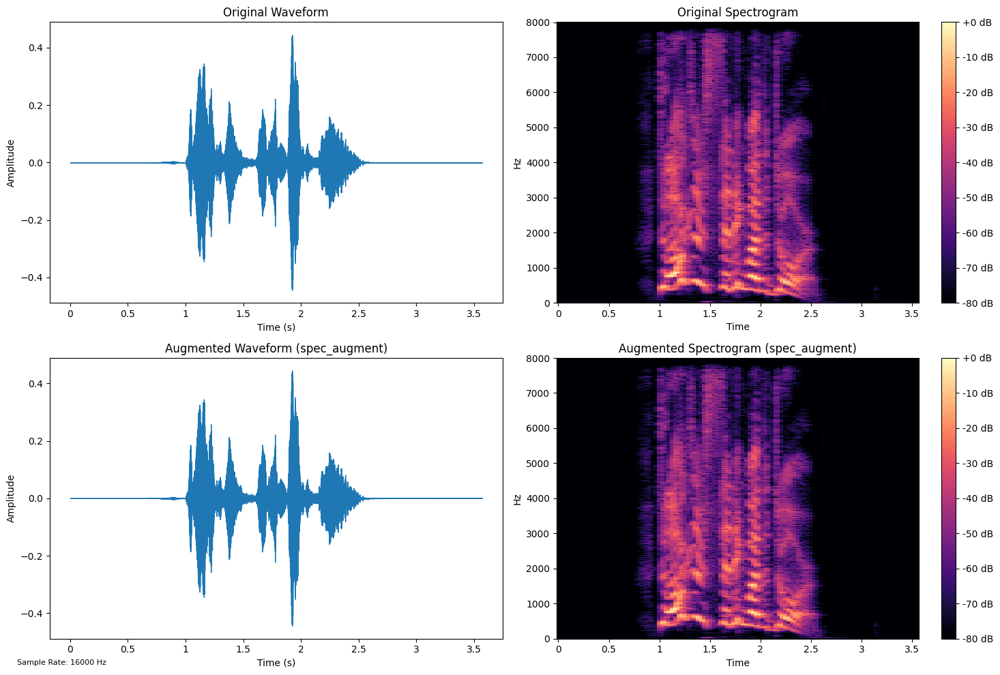


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 10
freq_mask_param: 10

Emotion: happy, Time Mask: 20, Freq Mask: 20


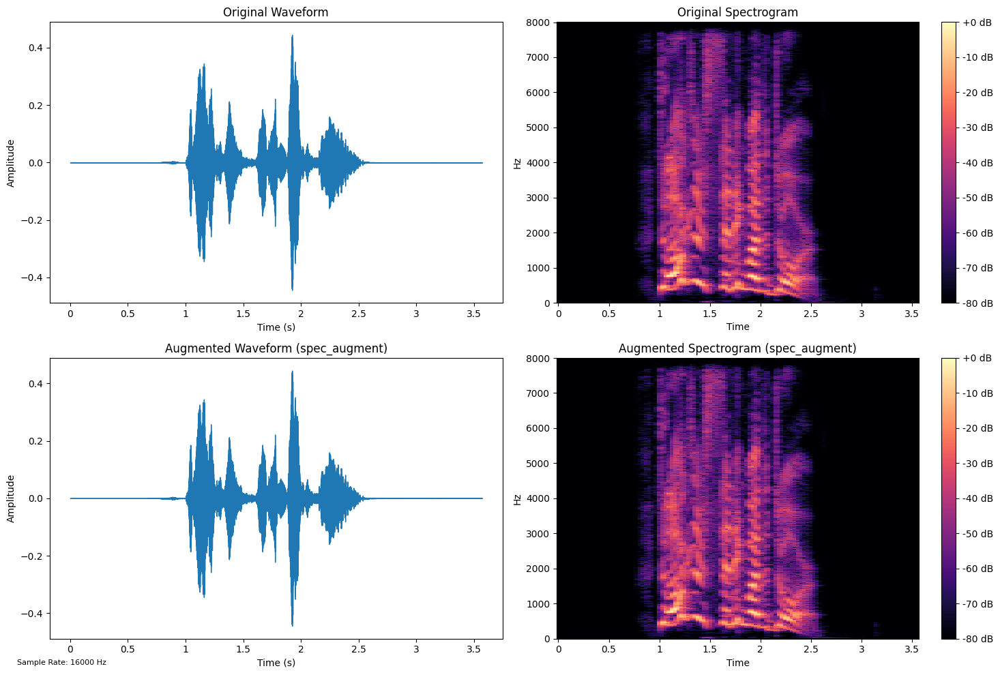


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 20
freq_mask_param: 20

Emotion: happy, Time Mask: 30, Freq Mask: 30


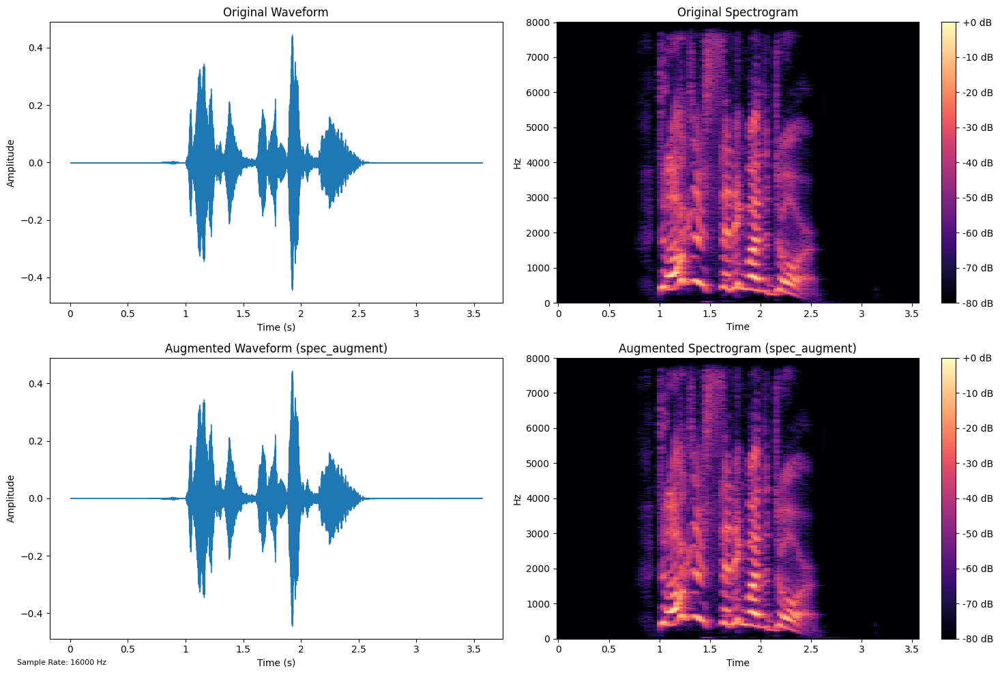


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.57 seconds
Augmented Duration: 3.57 seconds

Augmentation Parameters:
time_mask_param: 30
freq_mask_param: 30

=== Augmentation Testing Summary ===


,,mean,std,count
augmentation,emotion,,,
add_noise,happy,1.731274,0.028486,3
spec_augment,happy,1.615044,0.027390,3
time_stretch,happy,1.766120,0.163714,5


  emotion  augmentation parameters  duration
0   happy  time_stretch   rate=0.8  1.699792
1   happy  time_stretch   rate=0.9  1.765780
2   happy  time_stretch   rate=1.0  2.047626
3   happy  time_stretch   rate=1.1  1.643115
4   happy  time_stretch   rate=1.2  1.674289


In [ ]:
results = test_augmentation_parameters(
    train_df,
    emotions=['happy']
)

# The results DataFrame contains timing and parameter information
print(results.head())

### N-CP Augmentation

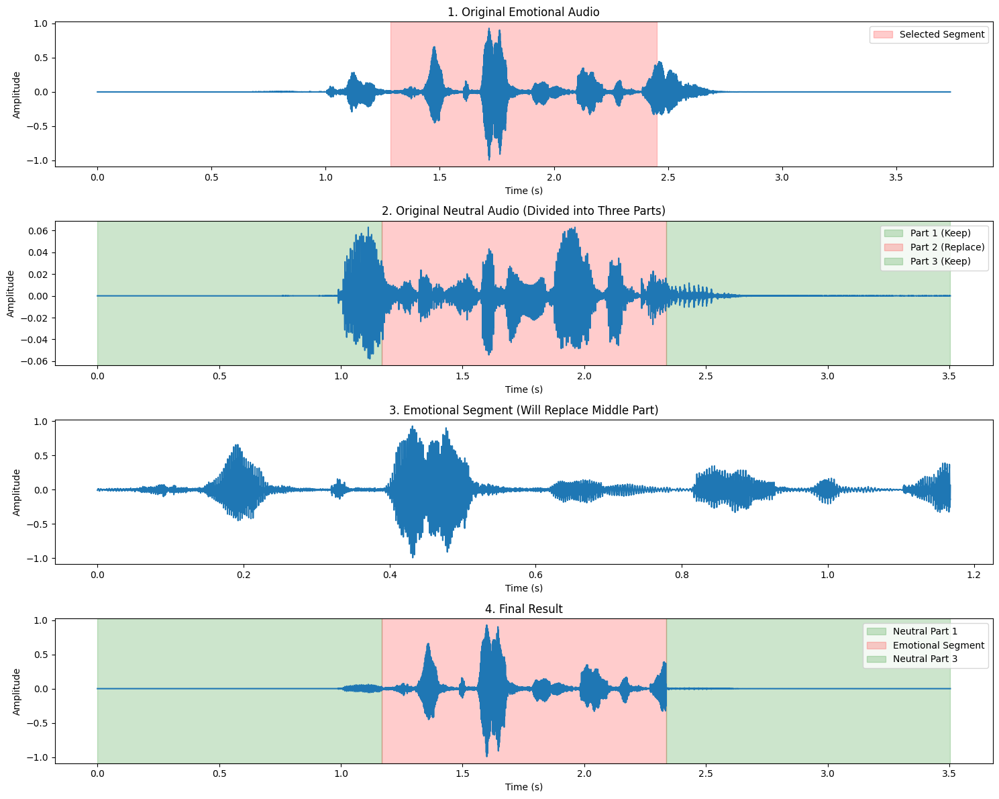


1. Original Emotional Audio:



2. Original Neutral Audio:



3. Parts separately:
   a. First Part (Neutral):


   b. Emotional Segment (Replacing Middle Part):


   c. Last Part (Neutral):



4. Final Result:


In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import soundfile as sf
import io

import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def demonstrate_ncp_augmentation_colab(emotional_path: str,
                                     neutral_path: str,
                                     sample_rate: int = 16000):
    """
    Demonstrate the N-CP augmentation process by:
    1. Dividing neutral audio into three equal parts
    2. Replacing the middle part with an emotional segment
    """
    # Load the audio files
    emotional_audio, _ = librosa.load(emotional_path, sr=sample_rate)
    neutral_audio, _ = librosa.load(neutral_path, sr=sample_rate)

    # Calculate the length of each part (we'll divide neutral into three equal parts)
    part_length = len(neutral_audio) // 3

    # Extract the three parts of neutral audio
    neutral_part1 = neutral_audio[0:part_length]
    neutral_part2 = neutral_audio[part_length:2*part_length]  # This will be replaced
    neutral_part3 = neutral_audio[2*part_length:3*part_length]

    # Extract matching length segment from emotional audio
    # Take it from the middle of emotional audio where emotion might be strongest
    emotional_start = (len(emotional_audio) - part_length) // 2
    emotional_segment = emotional_audio[emotional_start:emotional_start + part_length]

    # Create the result by concatenating parts
    result = np.concatenate([
        neutral_part1,      # First part: neutral
        emotional_segment,  # Middle part: emotional
        neutral_part3       # Last part: neutral
    ])

    # Visualize the process
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))

    # Original emotional audio
    time_emotional = np.arange(len(emotional_audio)) / sample_rate
    axes[0].plot(time_emotional, emotional_audio)
    axes[0].set_title('1. Original Emotional Audio')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].axvspan(emotional_start/sample_rate,
                    (emotional_start + part_length)/sample_rate,
                    color='red', alpha=0.2, label='Selected Segment')
    axes[0].legend()

    # Original neutral audio with parts marked
    time_neutral = np.arange(len(neutral_audio)) / sample_rate
    axes[1].plot(time_neutral, neutral_audio)
    axes[1].set_title('2. Original Neutral Audio (Divided into Three Parts)')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude')

    # Color the three parts
    axes[1].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 1 (Keep)')
    axes[1].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Part 2 (Replace)')
    axes[1].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 3 (Keep)')
    axes[1].legend()

    # Selected emotional segment
    time_segment = np.arange(len(emotional_segment)) / sample_rate
    axes[2].plot(time_segment, emotional_segment)
    axes[2].set_title('3. Emotional Segment (Will Replace Middle Part)')
    axes[2].set_xlabel('Time (s)')
    axes[2].set_ylabel('Amplitude')

    # Final augmented audio
    time_result = np.arange(len(result)) / sample_rate
    axes[3].plot(time_result, result)
    axes[3].set_title('4. Final Result')
    axes[3].set_xlabel('Time (s)')
    axes[3].set_ylabel('Amplitude')

    # Color the parts in result
    axes[3].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 1')
    axes[3].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Emotional Segment')
    axes[3].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 3')
    axes[3].legend()

    plt.tight_layout()
    plt.show()

    # Play the audio files
    print("\n1. Original Emotional Audio:")
    display(Audio(emotional_audio, rate=sample_rate))

    print("\n2. Original Neutral Audio:")
    display(Audio(neutral_audio, rate=sample_rate))

    print("\n3. Parts separately:")
    print("   a. First Part (Neutral):")
    display(Audio(neutral_part1, rate=sample_rate))
    print("   b. Emotional Segment (Replacing Middle Part):")
    display(Audio(emotional_segment, rate=sample_rate))
    print("   c. Last Part (Neutral):")
    display(Audio(neutral_part3, rate=sample_rate))

    print("\n4. Final Result:")
    display(Audio(result, rate=sample_rate))

    return result

# Get one emotional and one neutral sample
emotional_sample = train_df[train_df['emotion'] == 'angry'].iloc[0]
neutral_sample = train_df[train_df['emotion'] == 'neutral'].iloc[0]

# Run demonstration with audio playback
augmented_audio = demonstrate_ncp_augmentation_colab(
    emotional_path=emotional_sample['path'],
    neutral_path=neutral_sample['path']
)

Seperatly

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def apply_ncp_augmentation(emotional_audio: np.ndarray,
                          neutral_audio: np.ndarray) -> np.ndarray:
    """
    Apply Neutral-CopyPaste augmentation to create an emotionally augmented utterance.

    Args:
        emotional_audio: Source array containing emotional speech
        neutral_audio: Target array containing neutral speech to be augmented

    Returns:
        Augmented audio array with emotional segment inserted
    """
    # Calculate part length (divide neutral into three equal parts)
    part_length = len(neutral_audio) // 3

    # Extract neutral parts
    neutral_part1 = neutral_audio[0:part_length]
    neutral_part3 = neutral_audio[2*part_length:3*part_length]

    # Extract emotional segment from middle
    emotional_start = (len(emotional_audio) - part_length) // 2
    emotional_segment = emotional_audio[emotional_start:emotional_start + part_length]

    # Concatenate parts
    result = np.concatenate([
        neutral_part1,      # First part: neutral
        emotional_segment,  # Middle part: emotional
        neutral_part3       # Last part: neutral
    ])

    return result

def visualize_ncp_augmentation(emotional_path: str,
                             neutral_path: str,
                             sample_rate: int = 16000):
    """
    Demonstrate the N-CP augmentation process with visualizations and audio playback.

    Args:
        emotional_path: Path to emotional audio file
        neutral_path: Path to neutral audio file
        sample_rate: Audio sample rate in Hz
    """
    # Load audio files
    emotional_audio, _ = librosa.load(emotional_path, sr=sample_rate)
    neutral_audio, _ = librosa.load(neutral_path, sr=sample_rate)

    # Apply augmentation
    result = apply_ncp_augmentation(emotional_audio, neutral_audio)

    # Calculate lengths for visualization
    part_length = len(neutral_audio) // 3
    emotional_start = (len(emotional_audio) - part_length) // 2
    emotional_segment = emotional_audio[emotional_start:emotional_start + part_length]

    # Create visualization
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))

    # Plot 1: Original emotional audio
    time_emotional = np.arange(len(emotional_audio)) / sample_rate
    axes[0].plot(time_emotional, emotional_audio)
    axes[0].set_title('1. Original Emotional Audio')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].axvspan(emotional_start/sample_rate,
                    (emotional_start + part_length)/sample_rate,
                    color='red', alpha=0.2, label='Selected Segment')
    axes[0].legend()

    # Plot 2: Original neutral audio
    time_neutral = np.arange(len(neutral_audio)) / sample_rate
    axes[1].plot(time_neutral, neutral_audio)
    axes[1].set_title('2. Original Neutral Audio (Divided into Three Parts)')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude')
    axes[1].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 1 (Keep)')
    axes[1].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Part 2 (Replace)')
    axes[1].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 3 (Keep)')
    axes[1].legend()

    # Plot 3: Emotional segment
    time_segment = np.arange(len(emotional_segment)) / sample_rate
    axes[2].plot(time_segment, emotional_segment)
    axes[2].set_title('3. Emotional Segment (Will Replace Middle Part)')
    axes[2].set_xlabel('Time (s)')
    axes[2].set_ylabel('Amplitude')

    # Plot 4: Final result
    time_result = np.arange(len(result)) / sample_rate
    axes[3].plot(time_result, result)
    axes[3].set_title('4. Final Result')
    axes[3].set_xlabel('Time (s)')
    axes[3].set_ylabel('Amplitude')
    axes[3].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 1')
    axes[3].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Emotional Segment')
    axes[3].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 3')
    axes[3].legend()

    plt.tight_layout()
    plt.show()

    # Audio playback
    print("\n1. Original Emotional Audio:")
    display(Audio(emotional_audio, rate=sample_rate))

    print("\n2. Original Neutral Audio:")
    display(Audio(neutral_audio, rate=sample_rate))

    print("\n3. Parts separately:")
    print("   a. First Part (Neutral):")
    display(Audio(neutral_audio[0:part_length], rate=sample_rate))
    print("   b. Emotional Segment (Replacing Middle Part):")
    display(Audio(emotional_segment, rate=sample_rate))
    print("   c. Last Part (Neutral):")
    display(Audio(neutral_audio[2*part_length:3*part_length], rate=sample_rate))

    print("\n4. Final Result:")
    display(Audio(result, rate=sample_rate))

    return result

Example with 'angry emotion:

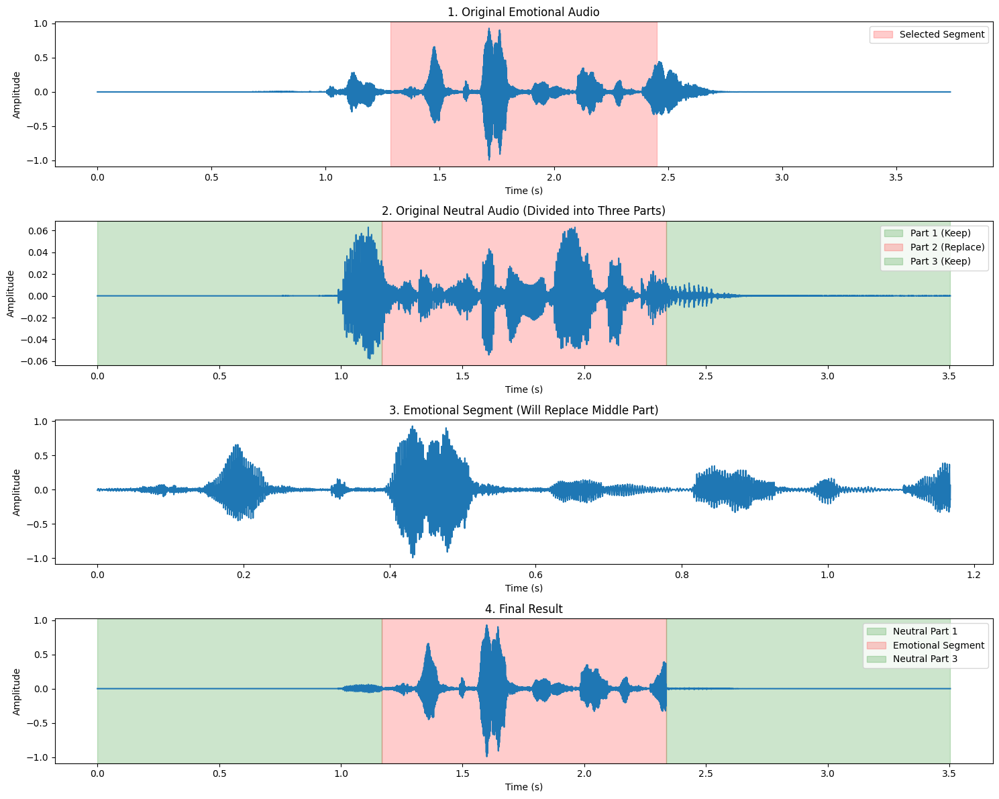


1. Original Emotional Audio:



2. Original Neutral Audio:



3. Parts separately:
   a. First Part (Neutral):


   b. Emotional Segment (Replacing Middle Part):


   c. Last Part (Neutral):



4. Final Result:


In [ ]:
# Get one emotional and one neutral sample
emotional_sample = train_df[train_df['emotion'] == 'angry'].iloc[0]
neutral_sample = train_df[train_df['emotion'] == 'neutral'].iloc[0]

# Example 1: Just apply augmentation
emotional_audio, sr = librosa.load(emotional_sample['path'], sr=16000)
neutral_audio, _ = librosa.load(neutral_sample['path'], sr=16000)
augmented_audio = apply_ncp_augmentation(emotional_audio, neutral_audio)

# Example 2: Visualize the process
augmented_audio_with_viz = visualize_ncp_augmentation(
    emotional_path=emotional_sample['path'],
    neutral_path=neutral_sample['path']
)

### Apply augmentation to data frames

First method is with 1:1 ratio as for each sample in the source set will be the input for the augmentation method and its augmented version will be created using a sampled paras.

In [ ]:
import os

def create_augmented_df_sample(df: pd.DataFrame, aug_type: str, split: str) -> pd.DataFrame:
    """
    Creates augmented version of dataset using specified augmentation with sampled parameters

    Args:
        df: Original dataframe with [gender, emotion, labels, source, path]
        aug_type: One of ['time_stretch', 'add_noise', 'spec_augment']
        split: Either 'train' or 'test' to separate storage

    Returns:
        DataFrame with augmented samples (1:1 with original)
    """
    # Create directory if it doesn't exist
    save_dir = f"augmented/{split}/{aug_type}"
    os.makedirs(save_dir, exist_ok=True)

    augmented_rows = []

    for idx, row in df.iterrows():
        # Load audio
        audio, sr = librosa.load(row['path'], sr=16000)

        # Sample parameters based on augmentation type
        if aug_type == 'time_stretch':
            param = np.random.choice(param_values["time_stretch"])
            aug_audio = time_stretch(audio, rate=param)
            param_str = f"rate{param}"

        elif aug_type == 'add_noise':
            param = np.random.choice(param_values["add_noise"])
            aug_audio = add_noise(audio, noise_level=param)
            param_str = f"noise{param}"

        elif aug_type == 'spec_augment':
            time_mask = np.random.choice(param_values["spec_augment"]["time_mask_param"])
            freq_mask = np.random.choice(param_values["spec_augment"]["freq_mask_param"])
            aug_audio = spec_augment(audio, sr, time_mask_param=time_mask, freq_mask_param=freq_mask)
            param = {'time_mask': time_mask, 'freq_mask': freq_mask}
            param_str = f"time{time_mask}_freq{freq_mask}"

        # Save augmented audio
        aug_path = os.path.join(save_dir, f"{idx}_{param_str}_{row['emotion']}.wav")
        sf.write(aug_path, aug_audio, sr)

        # Create new row
        new_row = {
            'gender': row['gender'],
            'emotion': row['emotion'],
            'labels': row['labels'],
            'source': row['source'],
            'path': aug_path,
            'aug_type': aug_type,
            'aug_params': param
        }
        augmented_rows.append(new_row)

    return pd.DataFrame(augmented_rows)

Creation of 1:1 train and test sets

In [ ]:
# For train set
train_time_stretched_df = create_augmented_df_sample(train_df, 'time_stretch', 'train')
train_noisy_df = create_augmented_df_sample(train_df, 'add_noise', 'train')
train_spec_df = create_augmented_df_sample(train_df, 'spec_augment', 'train')

# For test set
test_time_stretched_df = create_augmented_df_sample(test_df, 'time_stretch', 'test')
test_noisy_df = create_augmented_df_sample(test_df, 'add_noise', 'test')
test_spec_df = create_augmented_df_sample(test_df, 'spec_augment', 'test')

Conbine training set for each augmentation method

In [ ]:
# First, add augmentation info to original dataframes
train_df['aug_type'] = 'clean'  # or 'none' or 'not_augmented'
train_df['aug_params'] = None

test_df['aug_type'] = 'clean'
test_df['aug_params'] = None

In [ ]:
# For training set
train_combined_time_stretch = pd.concat([train_df, train_time_stretched_df], ignore_index=True)
train_combined_noise = pd.concat([train_df, train_noisy_df], ignore_index=True)
train_combined_spec = pd.concat([train_df, train_spec_df], ignore_index=True)

# For test set
test_combined_time_stretch = pd.concat([test_df, test_time_stretched_df], ignore_index=True)
test_combined_noise = pd.concat([test_df, test_noisy_df], ignore_index=True)
test_combined_spec = pd.concat([test_df, test_spec_df], ignore_index=True)

print("Training sets:")
print(f"Original: {len(train_df)}")
print(f"Time-stretched combined: {len(train_combined_time_stretch)}")
print(f"Noisy combined: {len(train_combined_noise)}")
print(f"SpecAugment combined: {len(train_combined_spec)}")
print(test_df.head())

Training sets:
Original: 998
Time-stretched combined: 1996
Noisy combined: 1996
SpecAugment combined: 1996
      gender  emotion  labels   source  \
397     male     fear       6  RAVDESS   
1108    male  neutral       1  RAVDESS   
942   female  disgust       7  RAVDESS   
1030  female      sad       4  RAVDESS   
914   female    happy       3  RAVDESS   

                                                   path aug_type aug_params  
397   ./Audio_Speech_Actors_01-24/Actor_07/03-01-06-...    clean       None  
1108  ./Audio_Speech_Actors_01-24/Actor_19/03-01-01-...    clean       None  
942   ./Audio_Speech_Actors_01-24/Actor_16/03-01-07-...    clean       None  
1030  ./Audio_Speech_Actors_01-24/Actor_18/03-01-04-...    clean       None  
914   ./Audio_Speech_Actors_01-24/Actor_16/03-01-03-...    clean       None  


<ipython-input-110-6392f47e3324>:2: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_combined_time_stretch = pd.concat([train_df, train_time_stretched_df], ignore_index=True)
<ipython-input-110-6392f47e3324>:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_combined_noise = pd.concat([train_df, train_noisy_df], ignore_index=True)
<ipython-input-110-6392f47e3324>:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this

### 2.4 Tokenization

Prepare audio processing and encoding

In [ ]:
def map_to_array(example):
   speech, _ = librosa.load(example["path"], sr=16000, mono=True)
   example["speech"] = speech
   return example

train_data = Dataset.from_pandas(train_combined_time_stretch).map(map_to_array)
test_data = Dataset.from_pandas(test_df).map(map_to_array)

feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained("superb/hubert-large-superb-er")

train_encodings = feature_extractor(list(train_data["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_encodings = feature_extractor(list(test_data["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")

Map:   0%|          | 0/1996 [00:00<?, ? examples/s]

Map:   0%|          | 0/250 [00:00<?, ? examples/s]

### 2.5 Turn data into a Dataset object

Define a Dataset class.

In [ ]:
# Dataset class
class EmotionDataset(torch.utils.data.Dataset):
   def __init__(self, encodings, labels):
       self.encodings = encodings
       pattern = {
           1: 0,  # neutral
           2: 0,  # neutral
           3: 1,  # happy
           4: 2,  # sad
           5: 3,  # angry
           6: 4,  # fear
           7: 5,  # disgust
           8: 6   # surprise
       }
       self.labels = [pattern[x] for x in labels]

   def __getitem__(self, idx):
       item = {key: val[idx] for key, val in self.encodings.items()}
       item['labels'] = torch.tensor(self.labels[idx])
       return item

   def __len__(self):
       return len(self.labels)

train_dataset = EmotionDataset(train_encodings, list(train_data["labels"]))
test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))

In [ ]:
print(train_dataset)
print(test_dataset)

## 4. Loading the Model and Optimizer

**Load tuned model**

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Load model and feature extractor from the saved path
model_path = "/content/drive/MyDrive/HuBERT_for_SER/preTrained_SER_7epochs_time_strech"
model = HubertForSequenceClassification.from_pretrained(model_path)
feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained(model_path)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

Mounted at /content/drive


OSError: Error no file named pytorch_model.bin, model.safetensors, tf_model.h5, model.ckpt.index or flax_model.msgpack found in directory /content/drive/MyDrive/HuBERT_for_SER/preTrained_SER_7epochs_time_strech.

**Base model to fine-tuned**

```
model = HubertForSequenceClassification.from_pretrained(
   "superb/hubert-large-superb-er",
   num_labels=7,
   ignore_mismatched_sizes=True
)
```

In [ ]:
# Loading the model
model = HubertForSequenceClassification.from_pretrained(
   "superb/hubert-large-superb-er",
   num_labels=7,
   ignore_mismatched_sizes=True
)
model.to(device)

# Loading the optimizer
optim = AdamW(model.parameters(), lr=1e-5)

Some weights of HubertForSequenceClassification were not initialized from the model checkpoint at superb/hubert-large-superb-er and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([4, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- classifier.bias: found shape torch.Size([4]) in the checkpoint and torch.Size([7]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model

HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertLayerNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (1-4): 4 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (pro

In [ ]:
# Right now, all the parameters are trainable
for name, param in model.named_parameters():
    print(name, param.requires_grad)

layer_weights True
hubert.masked_spec_embed True
hubert.feature_extractor.conv_layers.0.conv.weight True
hubert.feature_extractor.conv_layers.0.conv.bias True
hubert.feature_extractor.conv_layers.0.layer_norm.weight True
hubert.feature_extractor.conv_layers.0.layer_norm.bias True
hubert.feature_extractor.conv_layers.1.conv.weight True
hubert.feature_extractor.conv_layers.1.conv.bias True
hubert.feature_extractor.conv_layers.1.layer_norm.weight True
hubert.feature_extractor.conv_layers.1.layer_norm.bias True
hubert.feature_extractor.conv_layers.2.conv.weight True
hubert.feature_extractor.conv_layers.2.conv.bias True
hubert.feature_extractor.conv_layers.2.layer_norm.weight True
hubert.feature_extractor.conv_layers.2.layer_norm.bias True
hubert.feature_extractor.conv_layers.3.conv.weight True
hubert.feature_extractor.conv_layers.3.conv.bias True
hubert.feature_extractor.conv_layers.3.layer_norm.weight True
hubert.feature_extractor.conv_layers.3.layer_norm.bias True
hubert.feature_extracto

## 5. Training

Prediction function - using softmax for multiclassification task.

In [ ]:
# Prediction function
def predict(outputs):
   probabilities = torch.softmax(outputs["logits"], dim=1)
   predictions = torch.argmax(probabilities, dim=1)
   return predictions

Train the model.

In [ ]:
# Training

from torch.utils.data import DataLoader

# Training
epoch = 7
batch_size = 8
train_loss = []
train_accuracies = []

model.train()
for epoch_i in range(epoch):
   print(f'Epoch {epoch_i + 1}/{epoch}')
   time.sleep(0.3)

   train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
   correct = 0
   count = 0
   epoch_loss = []

   pbar = tqdm(train_loader)
   for batch in pbar:
       optim.zero_grad()
       input_ids = batch['input_values'].to(device)
       attention_mask = batch['attention_mask'].to(device)
       labels = batch['labels'].to(device)
       outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
       loss = outputs['loss']
       loss.backward()
       optim.step()

       predictions = predict(outputs)
       correct += predictions.eq(labels).sum().item()
       count += len(labels)
       accuracy = correct / count

       pbar.set_postfix({
           'Loss': f'{loss.item():.3f}',
           'Accuracy': f'{accuracy:.3f}'
       })
       epoch_loss.append(loss.item())

   pbar.close()
   train_loss += epoch_loss
   train_accuracies.append(accuracy)

Epoch 1/7


100%|██████████| 250/250 [01:24<00:00,  2.94it/s, Loss=1.547, Accuracy=0.253]


Epoch 2/7


100%|██████████| 250/250 [01:24<00:00,  2.94it/s, Loss=0.860, Accuracy=0.509]


Epoch 3/7


100%|██████████| 250/250 [01:24<00:00,  2.94it/s, Loss=0.601, Accuracy=0.649]


Epoch 4/7


100%|██████████| 250/250 [01:24<00:00,  2.97it/s, Loss=0.601, Accuracy=0.730]


Epoch 5/7


100%|██████████| 250/250 [01:24<00:00,  2.95it/s, Loss=0.193, Accuracy=0.777]


Epoch 6/7


100%|██████████| 250/250 [01:25<00:00,  2.94it/s, Loss=0.269, Accuracy=0.820]


Epoch 7/7


100%|██████████| 250/250 [01:24<00:00,  2.95it/s, Loss=0.433, Accuracy=0.849]


**Save model**

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Save model and feature extractor to Drive
save_path = "/content/drive/MyDrive/HuBERT_for_SER/Baseline"
model.save_pretrained(save_path)
feature_extractor.save_pretrained(save_path)

# Verify the save was successful
import os
saved_files = os.listdir(save_path)
print("Saved files:", saved_files)

# To load later:
# from transformers import HubertForSequenceClassification, Wav2Vec2FeatureExtractor

# # Path to the saved directory
# load_path = "/content/drive/MyDrive/HuBERT_for_SER"

# # Load model and feature extractor
# model = HubertForSequenceClassification.from_pretrained(
#     model_path,
#     use_safetensors=True)
# feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained(load_path)

# # Ensure model is on the correct device
# device = "cuda" if torch.cuda.is_available() else "cpu"
# model.to(device)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Saved files: ['config.json', 'model.safetensors', 'preprocessor_config.json']


In [ ]:
!zip -r /content/hubert_ser_baseline.zip /content/drive/MyDrive/HuBERT_for_SER/Baseline/*

updating: content/drive/MyDrive/HuBERT_for_SER/Baseline/config.json (deflated 65%)
updating: content/drive/MyDrive/HuBERT_for_SER/Baseline/model.safetensors (deflated 7%)
updating: content/drive/MyDrive/HuBERT_for_SER/Baseline/preprocessor_config.json (deflated 35%)


**Visualise train process**

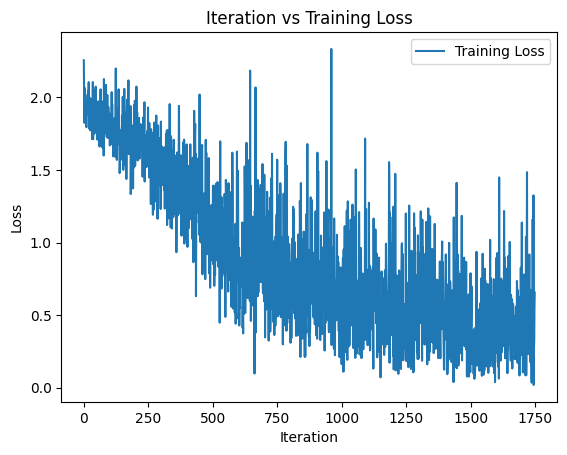

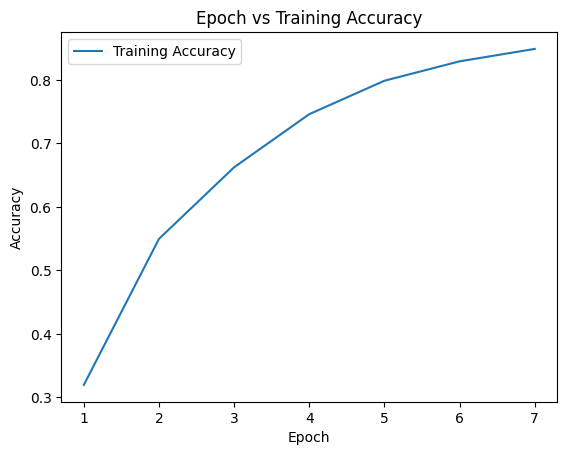

In [ ]:
# Plot Iteration vs Training Loss
plt.plot(train_loss, label="Training Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Iteration vs Training Loss")
plt.legend()
plt.show()

# Plot Epoch vs Training Accuracy
acc_X = np.arange(len(train_accuracies))+1
plt.plot(acc_X, train_accuracies,"-", label="Training Accuracy")
plt.xticks(acc_X)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Epoch vs Training Accuracy")
plt.legend()
plt.show()

## 6. Testing

### **Test the model - retrieve predictions**

In [ ]:
# Testing
from torch.utils.data import DataLoader

# Get test data by DataLoader
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Start testing
model.eval()

with torch.no_grad():
   correct = 0
   count = 0
   record = {"labels":[], "predictions":[]}

   pbar = tqdm(test_loader)
   for batch in pbar:
       input_ids = batch['input_values'].to(device)
       attention_mask = batch['attention_mask'].to(device)
       labels = batch['labels'].to(device)
       outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
       loss = outputs['loss']

       predictions = predict(outputs)
       correct += predictions.eq(labels).sum().item()
       count += len(labels)
       accuracy = correct / count

       pbar.set_postfix({
           'loss': f'{loss.item():.3f}',
           'accuracy': f'{accuracy:.3f}'
       })

       record["labels"] += labels.cpu().numpy().tolist()
       record["predictions"] += predictions.cpu().numpy().tolist()

   pbar.close()

print(f"\nFinal test accuracy: {accuracy*100:.4f}%")

100%|██████████| 250/250 [00:06<00:00, 37.60it/s, loss=0.232, accuracy=0.820]


Final test accuracy: 82.0000%


### **Analysis of the results**

In [ ]:
# Analysis
df_record = pd.DataFrame(record)
df_record.columns = ["Ground Truth", "Model Prediction"]

emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

In [ ]:
# Concat test texts and test records
df = pd.concat([test_df.reset_index(), df_record["Model Prediction"]], axis=1)
#df["emotion"] = df.apply(lambda x: x["emotion"][:3], axis=1)

# Show incorrect predictions
incorrect_predictions = df[df["emotion"] != df["Model Prediction"]]
incorrect_predictions.head(10)

,index,gender,emotion,labels,source,path,aug_type,aug_params,Model Prediction
0,397,male,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_07/03-01-06-...,clean,None,sad
10,1427,female,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_24/03-01-07-...,clean,None,angry
11,1362,male,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_23/03-01-03-...,clean,None,surprise
23,45,male,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...,clean,None,happy
29,1086,male,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_19/03-01-06-...,clean,None,sad
32,200,female,sad,4,RAVDESS,./Audio_Speech_Actors_01-24/Actor_04/03-01-04-...,clean,None,happy
41,966,male,disgust,7,RAVDESS,./Audio_Speech_Actors_01-24/Actor_17/03-01-07-...,clean,None,angry
47,823,female,happy,3,RAVDESS,./Audio_Speech_Actors_01-24/Actor_14/03-01-03-...,clean,None,surprise
54,425,female,fear,6,RAVDESS,./Audio_Speech_Actors_01-24/Actor_08/03-01-06-...,clean,None,happy
61,767,male,neutral,1,RAVDESS,./Audio_Speech_Actors_01-24/Actor_13/03-01-01-...,clean,None,happy


**Lets look at incorrect predictions**

In [ ]:
samples = incorrect_predictions.sample(n=3, random_state=42)
# Loop through the selected samples and display information
for idx, row in samples.iterrows():
    print(f"Sample {idx}:")
    print(f"True Emotion: {row['emotion']}")
    print(f"Predicted Emotion: {row['Model Prediction']}")
    print("Audio:")
    ipd.display(ipd.Audio(data=row["path"], autoplay=False, rate=16000))
    print("-" * 50)

Sample 150:
True Emotion: happy
Predicted Emotion: fear
Audio:


--------------------------------------------------
Sample 80:
True Emotion: disgust
Predicted Emotion: angry
Audio:


--------------------------------------------------
Sample 41:
True Emotion: disgust
Predicted Emotion: angry
Audio:


--------------------------------------------------


**Classification report**

In [ ]:
print("\nClassification Report:")
report = classification_report(
    df_record["Ground Truth"],
    df_record["Model Prediction"],
    target_names=emotions
)
print(report)


Classification Report:
              precision    recall  f1-score   support

     neutral       0.86      0.95      0.90        38
       happy       0.93      0.71      0.81        38
         sad       0.96      0.67      0.79        39
       angry       0.76      0.87      0.81        39
        fear       0.73      0.84      0.78        19
     disgust       0.73      0.77      0.75        39
    surprise       0.82      0.95      0.88        38

    accuracy                           0.82       250
   macro avg       0.83      0.82      0.82       250
weighted avg       0.83      0.82      0.82       250



**Confusion Matrix**

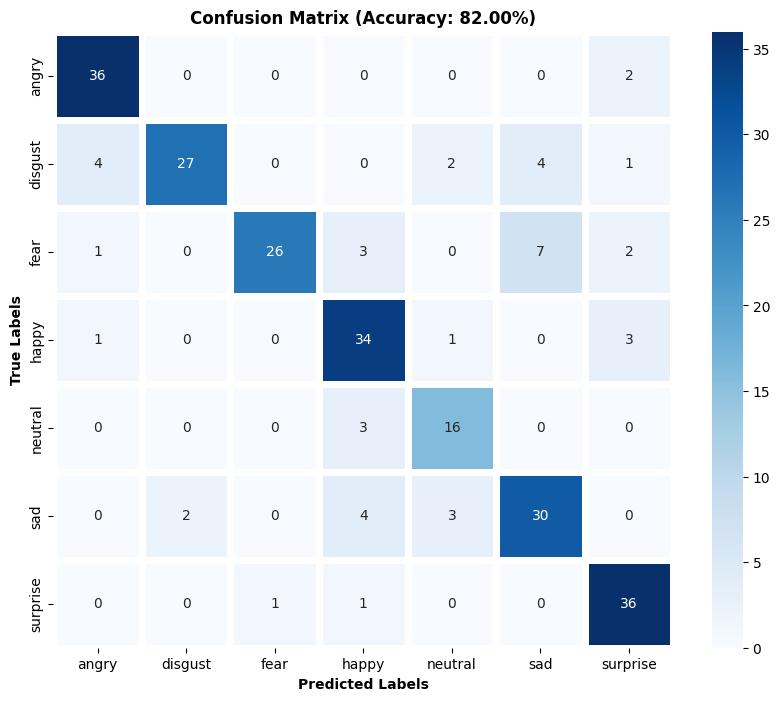

In [ ]:
# Confusion Matrix
crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
plt.figure(figsize=(10, 8))
sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy = df_record["Ground Truth"].eq(df_record["Model Prediction"]).sum() / len(df_record)
plt.title(f"Confusion Matrix (Accuracy: {accuracy*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

### **Testing on Augmented Test Set**


=== Testing on Augmented Test Set ===



Map:   0%|          | 0/250 [00:00<?, ? examples/s]

100%|██████████| 250/250 [00:06<00:00, 39.18it/s, loss=0.234, accuracy=0.772]


Final augmented test accuracy: 77.2000%

Incorrect predictions for augmented test set:
    index  gender  emotion  labels   source  \
0       0    male     fear       6  RAVDESS   
1       1    male  neutral       1  RAVDESS   
10     10  female  disgust       7  RAVDESS   
16     16    male      sad       4  RAVDESS   
19     19  female     fear       6  RAVDESS   
23     23    male      sad       4  RAVDESS   
29     29    male     fear       6  RAVDESS   
31     31    male      sad       4  RAVDESS   
32     32  female      sad       4  RAVDESS   
35     35  female      sad       4  RAVDESS   

                                                 path aug_type  aug_params  \
0   ./Audio_Speech_Actors_01-24/Actor_07/03-01-06-...    clean         NaN   
1   ./Audio_Speech_Actors_01-24/Actor_19/03-01-01-...    clean         NaN   
10  ./Audio_Speech_Actors_01-24/Actor_24/03-01-07-...    clean         NaN   
16  ./Audio_Speech_Actors_01-24/Actor_21/03-01-04-...    clean         NaN   
19  .

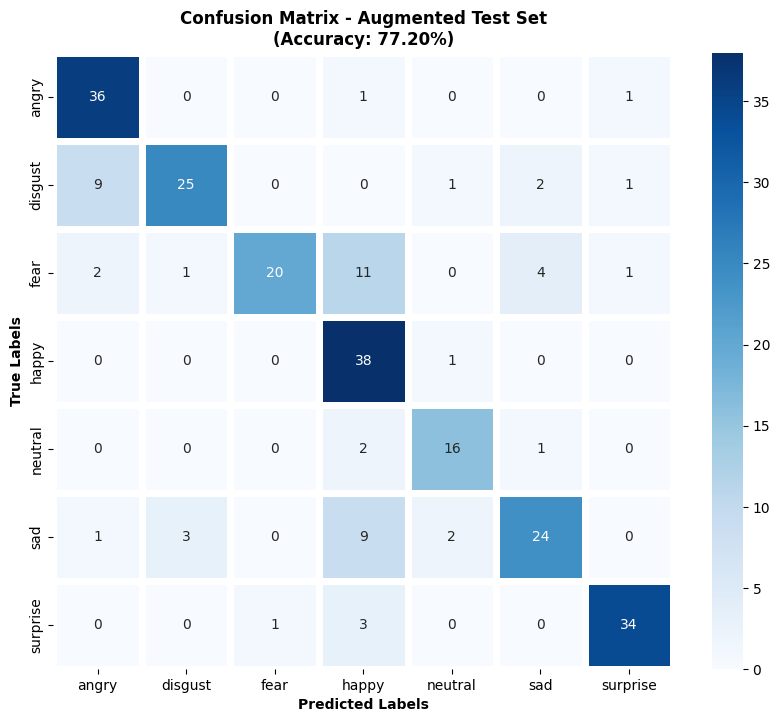

In [ ]:
print("\n=== Testing on Augmented Test Set ===\n")

# Get augmented test data by DataLoader
test_data_aug = Dataset.from_pandas(test_time_stretched_df).map(map_to_array)
test_aug_encodings = feature_extractor(list(test_data_aug["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_dataset_aug = EmotionDataset(test_aug_encodings, list(test_data_aug["labels"]))
test_loader_aug = DataLoader(test_dataset_aug, batch_size=1, shuffle=False)

# Start testing on augmented data
model.eval()

with torch.no_grad():
    correct = 0
    count = 0
    record = {"labels":[], "predictions":[]}

    pbar = tqdm(test_loader_aug)
    for batch in pbar:
        input_ids = batch['input_values'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs['loss']

        predictions = predict(outputs)
        correct += predictions.eq(labels).sum().item()
        count += len(labels)
        accuracy = correct / count

        pbar.set_postfix({
            'loss': f'{loss.item():.3f}',
            'accuracy': f'{accuracy:.3f}'
        })

        record["labels"] += labels.cpu().numpy().tolist()
        record["predictions"] += predictions.cpu().numpy().tolist()

    pbar.close()

print(f"Final augmented test accuracy: {accuracy*100:.4f}%")

# Analysis for augmented test set
df_record_aug = pd.DataFrame(record)
df_record_aug.columns = ["Ground Truth", "Model Prediction"]

df_record_aug["Ground Truth"] = df_record_aug["Ground Truth"].apply(lambda x: emotions[x])
df_record_aug["Model Prediction"] = df_record_aug["Model Prediction"].apply(lambda x: emotions[x])

# Concat test texts and test records for augmented data
df_aug = pd.concat([test_combined_time_stretch.reset_index(), df_record_aug["Model Prediction"]], axis=1)

# Show incorrect predictions for augmented data
incorrect_predictions_aug = df_aug[df_aug["emotion"] != df_aug["Model Prediction"]]
print("\nIncorrect predictions for augmented test set:")
print(incorrect_predictions_aug.head(10))

print("\nClassification Report for Augmented Test Set:")
report_aug = classification_report(
    df_record_aug["Ground Truth"],
    df_record_aug["Model Prediction"],
    target_names=emotions
)
print(report_aug)

# Confusion Matrix for augmented test set
plt.figure(figsize=(10, 8))
crosstab_aug = pd.crosstab(df_record_aug["Ground Truth"], df_record_aug["Model Prediction"])
sns.heatmap(crosstab_aug, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy_aug = df_record_aug["Ground Truth"].eq(df_record_aug["Model Prediction"]).sum() / len(df_record_aug)
plt.title(f"Confusion Matrix - Augmented Test Set\n(Accuracy: {accuracy_aug*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

### **Testing on Clean + Augmented Test Set**


=== Testing on Augmented Test Set ===



Map:   0%|          | 0/500 [00:00<?, ? examples/s]

100%|██████████| 500/500 [00:13<00:00, 38.19it/s, loss=0.234, accuracy=0.796]


Final augmented test accuracy: 79.6000%

Incorrect predictions for augmented test set:
    index  gender  emotion  labels   source  \
0       0    male     fear       6  RAVDESS   
10     10  female  disgust       7  RAVDESS   
11     11    male    happy       3  RAVDESS   
23     23    male      sad       4  RAVDESS   
29     29    male     fear       6  RAVDESS   
32     32  female      sad       4  RAVDESS   
41     41    male  disgust       7  RAVDESS   
47     47  female    happy       3  RAVDESS   
54     54  female     fear       6  RAVDESS   
61     61    male  neutral       1  RAVDESS   

                                                 path aug_type  aug_params  \
0   ./Audio_Speech_Actors_01-24/Actor_07/03-01-06-...    clean         NaN   
10  ./Audio_Speech_Actors_01-24/Actor_24/03-01-07-...    clean         NaN   
11  ./Audio_Speech_Actors_01-24/Actor_23/03-01-03-...    clean         NaN   
23  ./Audio_Speech_Actors_01-24/Actor_01/03-01-04-...    clean         NaN   
29  .

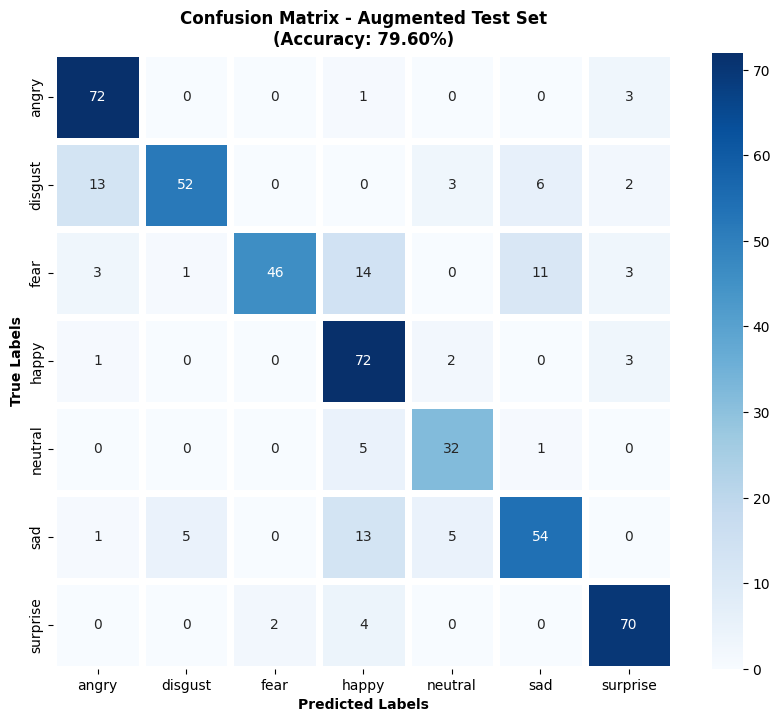

In [ ]:
print("\n=== Testing on Augmented Test Set ===\n")

# Get augmented test data by DataLoader
test_data_aug = Dataset.from_pandas(test_combined_time_stretch).map(map_to_array)
test_aug_encodings = feature_extractor(list(test_data_aug["speech"]), sampling_rate=16000, padding=True, return_tensors="pt")
test_dataset_aug = EmotionDataset(test_aug_encodings, list(test_data_aug["labels"]))
test_loader_aug = DataLoader(test_dataset_aug, batch_size=1, shuffle=False)

# Start testing on augmented data
model.eval()

with torch.no_grad():
    correct = 0
    count = 0
    record = {"labels":[], "predictions":[]}

    pbar = tqdm(test_loader_aug)
    for batch in pbar:
        input_ids = batch['input_values'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs['loss']

        predictions = predict(outputs)
        correct += predictions.eq(labels).sum().item()
        count += len(labels)
        accuracy = correct / count

        pbar.set_postfix({
            'loss': f'{loss.item():.3f}',
            'accuracy': f'{accuracy:.3f}'
        })

        record["labels"] += labels.cpu().numpy().tolist()
        record["predictions"] += predictions.cpu().numpy().tolist()

    pbar.close()

print(f"Final augmented test accuracy: {accuracy*100:.4f}%")

# Analysis for augmented test set
df_record_aug = pd.DataFrame(record)
df_record_aug.columns = ["Ground Truth", "Model Prediction"]

df_record_aug["Ground Truth"] = df_record_aug["Ground Truth"].apply(lambda x: emotions[x])
df_record_aug["Model Prediction"] = df_record_aug["Model Prediction"].apply(lambda x: emotions[x])

# Concat test texts and test records for augmented data
df_aug = pd.concat([test_combined_time_stretch.reset_index(), df_record_aug["Model Prediction"]], axis=1)

# Show incorrect predictions for augmented data
incorrect_predictions_aug = df_aug[df_aug["emotion"] != df_aug["Model Prediction"]]
print("\nIncorrect predictions for augmented test set:")
print(incorrect_predictions_aug.head(10))

print("\nClassification Report for Augmented Test Set:")
report_aug = classification_report(
    df_record_aug["Ground Truth"],
    df_record_aug["Model Prediction"],
    target_names=emotions
)
print(report_aug)

# Confusion Matrix for augmented test set
plt.figure(figsize=(10, 8))
crosstab_aug = pd.crosstab(df_record_aug["Ground Truth"], df_record_aug["Model Prediction"])
sns.heatmap(crosstab_aug, cmap='Blues', annot=True, fmt='g', linewidths=5)
accuracy_aug = df_record_aug["Ground Truth"].eq(df_record_aug["Model Prediction"]).sum() / len(df_record_aug)
plt.title(f"Confusion Matrix - Augmented Test Set\n(Accuracy: {accuracy_aug*100:.2f}%)", fontweight='bold')
plt.ylabel("True Labels", fontweight='bold')
plt.xlabel("Predicted Labels", fontweight='bold')
plt.show()

## 7. Testing all test sets

**Load the Time Strech model**

In [ ]:
# Load model and feature extractor from the saved path
model_path = f"{BASE_DIR}/Augmented models/Time-streched"
model = HubertForSequenceClassification.from_pretrained(model_path)
feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained(model_path)
model.to(device)

HubertForSequenceClassification(
  (hubert): HubertModel(
    (feature_extractor): HubertFeatureEncoder(
      (conv_layers): ModuleList(
        (0): HubertLayerNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (1-4): 4 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
        (5-6): 2 x HubertLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): HubertFeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (pro

**Load the test sets**

In [ ]:
import os
import shutil
import pandas as pd
import pickle

def load_test_sets(base_dir='test_sets_backup'):
    """
    Loads all saved test sets and restores original naming with spaces.
    """
    loaded_sets = {}

    # Go through each folder in the base directory
    for set_folder in os.listdir(base_dir):
        if os.path.isdir(os.path.join(base_dir, set_folder)):
            # Load the DataFrame
            df_path = os.path.join(base_dir, set_folder, 'metadata.pkl')
            if os.path.exists(df_path):
                # Convert folder name back to original format (replace underscores with spaces)
                original_name = set_folder.replace('_', ' ')
                loaded_sets[original_name] = pd.read_pickle(df_path)

    return loaded_sets

In [ ]:
# Load all test sets
test_sets_path = f"{BASE_DIR}/Datasets/RAVDNESS"
loaded_test_sets = load_test_sets(test_sets_path)

# Select only relevant test sets for noise model
relevant_sets = {
    'Clean': loaded_test_sets['Clean'],
    'Time Stretched': loaded_test_sets['Time Stretched'],
    'Combined Time Stretch': loaded_test_sets['Combined Time Stretch']
}

**Function to test a single test set**

In [ ]:
def map_to_array(example):
   speech, _ = librosa.load(example["path"], sr=16000, mono=True)
   example["speech"] = speech
   return example

class EmotionDataset(torch.utils.data.Dataset):
   def __init__(self, encodings, labels):
       self.encodings = encodings
       pattern = {
           1: 0,  # neutral
           2: 0,  # neutral
           3: 1,  # happy
           4: 2,  # sad
           5: 3,  # angry
           6: 4,  # fear
           7: 5,  # disgust
           8: 6   # surprise
       }
       self.labels = [pattern[x] for x in labels]

   def __getitem__(self, idx):
       item = {key: val[idx] for key, val in self.encodings.items()}
       item['labels'] = torch.tensor(self.labels[idx])
       return item

   def __len__(self):
       return len(self.labels)

# Prediction function
def predict(outputs):
   probabilities = torch.softmax(outputs["logits"], dim=1)
   predictions = torch.argmax(probabilities, dim=1)
   return predictions

In [ ]:
def evaluate_test_set(model, model_name, test_df, set_name, device, feature_extractor):
    """
    Evaluates model performance on a given test set and generates analysis

    Args:
        model: The trained model
        test_df: DataFrame containing test data
        set_name: String identifying the test set (e.g., 'Noise', 'Time Stretch')
        emotions: List of emotion labels
        device: torch device
        feature_extractor: HuBERT feature extractor
    """
    # Ensure model is in eval mode and gradients are disabled
    model.eval()
    for param in model.parameters():
        param.requires_grad = False

    # Prepare data
    test_data = Dataset.from_pandas(test_df).map(map_to_array)
    test_encodings = feature_extractor(
        list(test_data["speech"]),
        sampling_rate=16000,
        padding=True,
        return_tensors="pt"
    )
    test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    # Testing loop
    with torch.no_grad():
        correct = 0
        count = 0
        record = {"labels": [], "predictions": []}

        pbar = tqdm(test_loader, desc=f"Testing {set_name}")
        for batch in pbar:
            input_ids = batch['input_values'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)

            predictions = predict(outputs)
            correct += predictions.eq(labels).sum().item()
            count += len(labels)
            accuracy = correct / count

            pbar.set_postfix({
                'loss': f'{outputs["loss"].item():.3f}',
                'accuracy': f'{accuracy:.3f}'
            })

            record["labels"] += labels.cpu().numpy().tolist()
            record["predictions"] += predictions.cpu().numpy().tolist()

        pbar.close()

    # Analysis
    df_record = pd.DataFrame(record)
    df_record.columns = ["Ground Truth", "Model Prediction"]
    emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
    df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
    df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

    # Results printing
    print(f"\n=== Results for {set_name} ===")
    print(f"Final accuracy: {accuracy*100:.4f}%")

    # Classification report
    print(f"\nClassification Report for {model_name} model on {set_name} test set:")
    report = classification_report(
        df_record["Ground Truth"],
        df_record["Model Prediction"],
        target_names=emotions
    )
    print(report)

    # Confusion Matrix
    plt.figure(figsize=(10, 8))
    crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
    sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
    plt.title(f"Confusion Matrix for {model_name} model - {set_name} test set\n(Accuracy: {accuracy*100:.2f}%)", fontweight='bold')
    plt.ylabel("True Labels", fontweight='bold')
    plt.xlabel("Predicted Labels", fontweight='bold')
    plt.show()

    return accuracy, df_record

**Evaluate model only on relevant sets**


Evaluating Time Strech model on Clean dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Clean: 100%|██████████| 250/250 [00:23<00:00, 10.72it/s, loss=0.422, accuracy=0.852]



=== Results for Clean ===
Final accuracy: 85.2000%

Classification Report for Time Strech model on Clean test set:
              precision    recall  f1-score   support

     neutral       0.90      0.92      0.91        38
       happy       1.00      0.76      0.87        38
         sad       0.92      0.90      0.91        39
       angry       0.84      0.79      0.82        39
        fear       0.61      0.89      0.72        19
     disgust       0.94      0.77      0.85        39
    surprise       0.77      0.95      0.85        38

    accuracy                           0.85       250
   macro avg       0.85      0.86      0.85       250
weighted avg       0.87      0.85      0.85       250



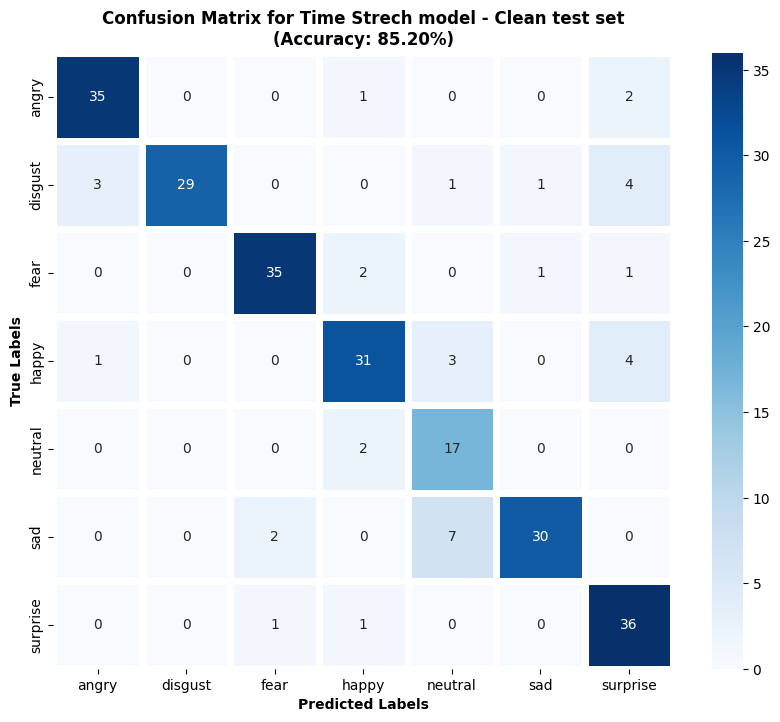


Evaluating Time Strech model on Time Stretched dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Time Stretched: 100%|██████████| 250/250 [00:28<00:00,  8.77it/s, loss=0.508, accuracy=0.780]



=== Results for Time Stretched ===
Final accuracy: 78.0000%

Classification Report for Time Strech model on Time Stretched test set:
              precision    recall  f1-score   support

     neutral       0.85      0.92      0.89        38
       happy       0.97      0.79      0.87        38
         sad       0.88      0.72      0.79        39
       angry       0.65      0.87      0.75        39
        fear       0.56      0.95      0.71        19
     disgust       0.82      0.46      0.59        39
    surprise       0.80      0.84      0.82        38

    accuracy                           0.78       250
   macro avg       0.79      0.79      0.77       250
weighted avg       0.81      0.78      0.78       250



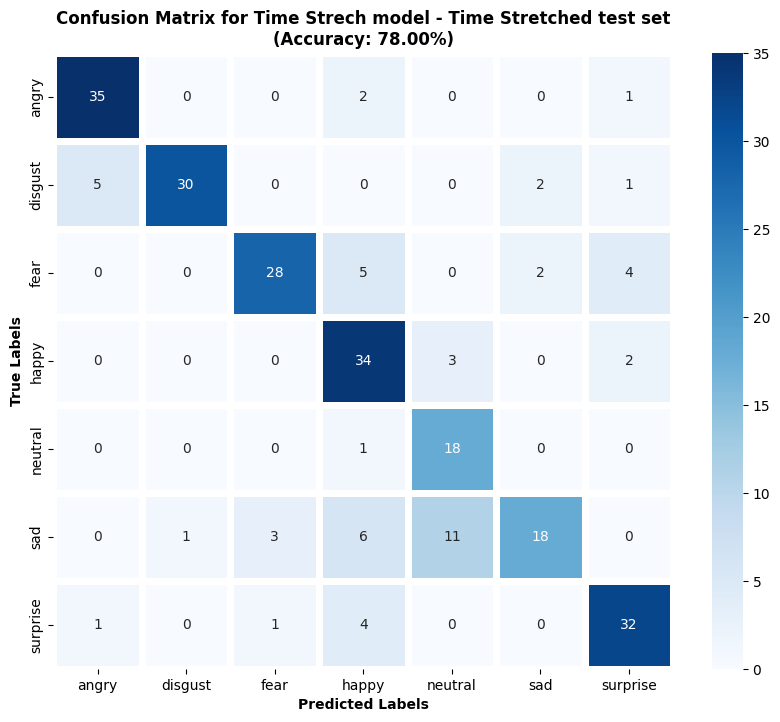


Evaluating Time Strech model on Combined Time Stretch dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined Time Stretch: 100%|██████████| 500/500 [00:56<00:00,  8.90it/s, loss=0.508, accuracy=0.816]



=== Results for Combined Time Stretch ===
Final accuracy: 81.6000%

Classification Report for Time Strech model on Combined Time Stretch test set:
              precision    recall  f1-score   support

     neutral       0.88      0.92      0.90        76
       happy       0.98      0.78      0.87        76
         sad       0.90      0.81      0.85        78
       angry       0.73      0.83      0.78        78
        fear       0.58      0.92      0.71        38
     disgust       0.89      0.62      0.73        78
    surprise       0.78      0.89      0.83        76

    accuracy                           0.82       500
   macro avg       0.82      0.82      0.81       500
weighted avg       0.84      0.82      0.82       500



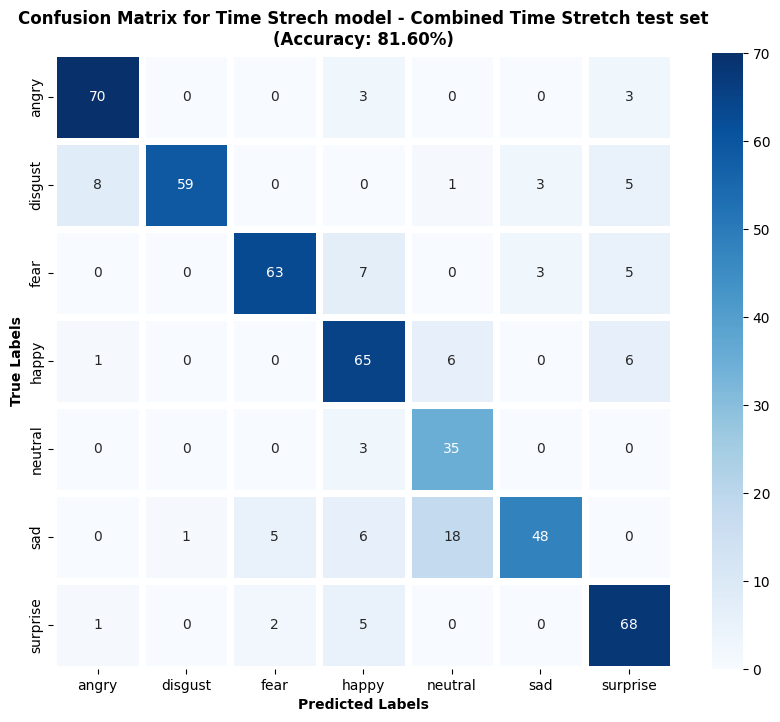

In [ ]:
results = {}
model_name = "Time Strech"
for set_name, test_data in relevant_sets.items():
    print(f"\nEvaluating Time Strech model on {set_name} dataset...")
    accuracy, df_record = evaluate_test_set(
        model,
        model_name,
        test_data,
        set_name,
        device,
        feature_extractor
    )
    results[set_name] = {'accuracy': accuracy, 'record': df_record}